# Scenario 4

(Before we start, let's just import some stuff that we'll need later)

In [1]:
import random
from typing import Optional, Tuple

from IPython.display import display, Image
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import torch
import torch.distributions as td
import torch.nn.functional as F
from torch import Tensor, nn
from torch.optim import Adam, lr_scheduler
from torch.utils.data import DataLoader
from tqdm import trange

from ethicml.algorithms.inprocess import LR, LRCV, InAlgorithm, Majority
from ethicml.algorithms.inprocess.blind import Blind
from ethicml.data import adult, compas, credit, crime, health, sqf, synthetic
from ethicml import metric_per_sensitive_attribute, diff_per_sensitive_attribute
from ethicml.implementations.pytorch_common import CustomDataset
from ethicml.metrics import Accuracy, Metric, ProbPos
from ethicml.preprocessing import scale_continuous, train_test_split
from ethicml.utility import DataTuple
from ethicml.visualisation import plot_results, save_2d_plot, save_jointplot, save_label_plot, save_multijointplot

np.random.seed(0)
torch.manual_seed(0)
random.seed(0)

epochs=20
latent_dims=2
latent_multiplier = 10
scenario = 1
targets = [1,2,3]

## Data

Throughout we're going to be using synthetic data. We could easily run all of this throughout with real-world datasets (launch this file using the icon at the top of the page and replace `synthetic(*args, **kwargs)` with any from `adult(), compas(), credit(), crime(), health(), sqf()`).

The synthetic data covers 4 scenarios. To avoid getting overly complex, we'll use Scenario 4 throughout unless otherwise specified.

### Scenario 1
![Scenario 1](./assets/scenario_1.png)

In this scenario, there are two input variables, $X_1$ and $X_2$.
There are three outcome variables, $Y_1$, $Y_2$ & $Y_3$.
There is one sensitive attribute, $S$, which is independent of all $X$ & $Y$.

### Scenario 2
![Scenario 2](./assets/scenario_2.png)

In this scenario, there are two input variables, $X_1$ and $X_2$.
There are three outcome variables, $Y_1$, $Y_2$ & $Y_3$.
There is one sensitive attribute, $S$, which is independent of $X_2$ & $Y_2$, but not independent of $X_1$, $Y_1$, or $Y_3$.

### Scenario 3
![Scenario 3](./assets/scenario_3.png)

In this scenario, there are two input variables, $X_1$ and $X_2$.
There are three outcome variables, $Y_1$, $Y_2$ & $Y_3$.
There is one sensitive attribute, $S$, which is independent of both $X$, $Y_1$ and $Y_2$, but not independent of $Y_3$.

### Scenario 4
![Scenario 4](./assets/scenario_4.png)

In this scenario, there are two input variables, $X_1$ and $X_2$.
There are three outcome variables, $Y_1$, $Y_2$ & $Y_3$.
There is one sensitive attribute, $S$, which is independent of $X_2$ & $Y_2$, but not independent of $X_1$, $Y_1$, or $Y_3$.

## Strategy 1

We have some input data $x$. We want a function that produces a version of this data ($z_x$), such that $z_x$ is independent of some protected characteristic $s$. In other words we want to find $e: X \rightarrow Z_x ~~\mathrm{s.t.}~ Z_x \perp S$.

Let's look at that. 

![setup1](assets/setup1.png)

The red line indicates that you cannot learn $S$ from $Z_x$; there is no mutual information between these two variables. They are independent.

The problem here is that the easiest way for a network to achieve this is to just learn nothing. Make $Z_x$ all $0$'s and your job is done. But that's a claim... let's demonstrate that.

### Building

Let's build the adversary

In [2]:
class GradReverse(torch.autograd.Function):
    """Gradient reversal layer"""

    @staticmethod
    def forward(ctx, x: Tensor, lambda_: float) -> Tensor:
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output: Tensor) -> Tuple[Tensor, Optional[Tensor]]:
        return grad_output.neg().mul(ctx.lambda_), None


def grad_reverse(features: Tensor, lambda_: float = 1.0) -> Tensor:
    return GradReverse.apply(features, lambda_)

class FeatureAdv(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.hid = nn.Linear(latent_dim, latent_dim*latent_multiplier)
        self.hid_1 = nn.Linear(latent_dim*latent_multiplier, latent_dim*latent_multiplier)
        self.bn_1 = nn.BatchNorm1d(latent_dim*latent_multiplier)
        self.out = nn.Linear(latent_dim*latent_multiplier, 1)

    def forward(self, z: td.Distribution):
        s = self.bn_1(F.relu(self.hid(grad_reverse(z))))
        return self.out(s)

The encoder

In [3]:
class FeatureEncoder(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.hid_1 = nn.Linear(in_size, latent_dim*latent_multiplier)
        self.bn_1 = nn.BatchNorm1d(latent_dim*latent_multiplier)
        self.hid_2 = nn.Linear(latent_dim*latent_multiplier, latent_dim*latent_multiplier)
        self.bn_2 = nn.BatchNorm1d(latent_dim*latent_multiplier)

        self.mu = nn.Linear(latent_dim*latent_multiplier, latent_dim)
        self.logvar = nn.Linear(latent_dim*latent_multiplier, latent_dim)

    def forward(self, x: torch.Tensor):
        z = self.bn_1(F.relu(self.hid_1(x)))
        z = F.relu(self.hid_2(z))
        return td.Normal(loc=self.mu(z), scale=F.softplus(self.logvar(z)))

Then the model

In [4]:
class Model1(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.enc = FeatureEncoder(in_size, latent_dim)
        self.adv = FeatureAdv(latent_dim)

    def forward(self, x):
        z = self.enc(x)
        s = self.adv(z.rsample())
        return z, s

And let's add some helper code

In [5]:
def evaluate_z(
    train: DataTuple,
    test: DataTuple,
    model: InAlgorithm = LRCV,
    metric: Metric = Accuracy,
    per_sens: bool = False,
):
    model = model()
    preds = model.run(train, test)

    if per_sens:
        overall = metric_per_sensitive_attribute(preds, test, metric())
        score = diff_per_sensitive_attribute(overall)
        print(f"{metric().name}: { {k: round(v*100, 3) for k, v in overall.items()} }, { {k: round(v*100, 3) for k, v in score.items()} }\n")
        score = [v*100 for k, v in score.items()][0]
    else:
        score = metric().score(preds, test)*100
        print(f"{metric().name}: {score:.3f}\n")
    return score

In [6]:
def encode1(loader: DataLoader, model: nn.Module, latent_dims: int):
    feats_train_encs: pd.DataFrame = pd.DataFrame(columns=[f"{i}" for i in range(latent_dims)])
    model.eval()
    with torch.no_grad():
        for (x, s, y) in loader:
            z, _ = model(x)
            feats_train_encs = pd.concat(
                [
                    feats_train_encs,
                    pd.DataFrame(z.sample().cpu().numpy(), columns=[f"{i}" for i in range(latent_dims)]),
                ],
                axis="rows",
                ignore_index=True,
            )

    return feats_train_encs

In [7]:

datasets = []
scalers = []
data = []
train = []
test = []
train_data = []
train_loaders = []
test_data = []
test_loaders = []
for target in targets:
    datasets.insert(target-1, synthetic(scenario=scenario, target=target, num_samples=10_000))
    data.insert(target-1, datasets[target-1].load())
    scalers.insert(target-1, StandardScaler())
    data.insert(target-1, scale_continuous(datasets[target-1], data[target-1], scalers[target-1])[0])
    train_test_tuple = train_test_split(data[target-1], train_percentage=0.8)
    train.insert(target-1, train_test_tuple[0])
    test.insert(target-1, train_test_tuple[1])
    train_data.insert(target-1, CustomDataset(train[target-1]))
    train_loaders.insert(target-1, DataLoader(train_data[target-1], batch_size=256))
    test_data.insert(target-1, CustomDataset(test[target-1]))
    test_loaders.insert(target-1, DataLoader(test_data[target-1], batch_size=256))


for target in targets:
    # save_2d_plot(_train[target], f"./plots/train_scenario_{scenario}_target_{target}.png")
    save_2d_plot(DataTuple(x=train[target-1].x[["x1", "x2"]], s=train[target-1].s, y=train[target-1].y), f"./plots/train_priv_scenario_{scenario}_target_{target}.png")
    save_jointplot(train[target-1], f"./plots/train_joint_scenario_{scenario}_target_{target}.png")
    save_multijointplot(train[target-1], f"./plots/train_multijoint_scenario_{scenario}_target_{target}.png")
    save_label_plot(train[target-1], f"./plots/train_labels_scenario_{scenario}_target_{target}.png")

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [8]:
original_acc = []
og_maj_acc = []
og_maj_fair = []
og_random_acc = []
original_fair = []
og_maj_fair = []
og_random_fair = []

for train_target in targets:
    original_acc.insert(train_target-1, [])
    og_maj_acc.insert(train_target-1, [])
    og_random_acc.insert(train_target-1, [])
    original_fair.insert(train_target-1, [])
    og_maj_fair.insert(train_target-1, [])
    og_random_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance on the original data trained with target {train_target}, evaluated on target {test_target}...")
        original_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1]))

        print(f"Majority classifier trained with target {train_target}, evaluated on target {test_target}...")
        og_maj_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1], model=Majority))

        print(f"Random classifier trained with target {train_target}, evaluated on target {test_target}...")
        og_random_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1], model=Blind))

        print(f"Fairness on the original data trained with target {train_target}, evaluated on target {test_target}...")
        original_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1], metric=ProbPos, per_sens=True))

        print(f"Fairness on the original data with a majority classifier trained with target {train_target}, evaluated on target {test_target}...")
        og_maj_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1], model=Majority, metric=ProbPos, per_sens=True))

        print(f"Fairness on the original data with a random classifier trained with target {train_target}, evaluated on target {test_target}...")
        og_random_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test[test_target-1], model=Blind, metric=ProbPos, per_sens=True))

Performance on the original data trained with target 1, evaluated on target 1...
Accuracy: 72.150

Majority classifier trained with target 1, evaluated on target 1...
Accuracy: 52.350

Random classifier trained with target 1, evaluated on target 1...
Accuracy: 50.350

Fairness on the original data trained with target 1, evaluated on target 1...
prob_pos: {'s_1': 97.575, 's_0': 2.861}, {'s_0-s_1': 94.715}

Fairness on the original data with a majority classifier trained with target 1, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Fairness on the original data with a random classifier trained with target 1, evaluated on target 1...
prob_pos: {'s_1': 50.418, 's_0': 49.129}, {'s_0-s_1': 1.289}

Performance on the original data trained with target 1, evaluated on target 2...
Accuracy: 46.300

Majority classifier trained with target 1, evaluated on target 2...
Accuracy: 37.900

Random classifier trained with target 1, evaluated on target 2...
Accuracy: 51

In [9]:
models_strategy_1 = []
post_trains_strategy_1 = []
post_tests_strategy_1 = []

for train_target in targets:
    post_trains_strategy_1.insert(train_target-1, [])
    post_tests_strategy_1.insert(train_target-1, [])

    models_strategy_1.insert(train_target-1, Model1(len(train[train_target-1].x.columns), latent_dims))
    
    optimiser1 = Adam(models_strategy_1[train_target-1].parameters(), lr=1e-3)
    scheduler1 = lr_scheduler.ExponentialLR(optimiser1, gamma=0.98)

    models_strategy_1[train_target-1].train()

    with trange(epochs) as t:
        for epoch in t:
            for (x, s, y) in train_loaders[train_target-1]:
                z, s_pred = models_strategy_1[train_target-1](x)

                feat_prior = td.Normal(loc=torch.zeros(latent_dims), scale=torch.ones(latent_dims))
                feat_kl_loss = td.kl.kl_divergence(z, feat_prior)

                feat_sens_loss = F.binary_cross_entropy_with_logits(s_pred, s, reduction="mean")

                loss1 = 0.6*feat_sens_loss + 0.4*feat_kl_loss.mean() # If you want to try without a prior, comment out the last term

                t.set_postfix(loss=loss1.item())
                loss1.backward()
                optimiser1.step()
                optimiser1.zero_grad()
            scheduler1.step()
    models_strategy_1[train_target-1].eval()

    
    for test_target in targets:

        post_trains_strategy_1[train_target-1].insert(test_target-1, DataTuple(x=encode1(train_loaders[test_target-1], models_strategy_1[train_target-1], latent_dims), s=train[test_target-1].s, y=train[test_target-1].y))
        post_tests_strategy_1[train_target-1].insert(test_target-1, DataTuple(x=encode1(test_loaders[test_target-1], models_strategy_1[train_target-1], latent_dims), s=test[test_target-1].s, y=test[test_target-1].y))

        save_2d_plot(post_trains_strategy_1[train_target-1][test_target-1], f"./plots/strategy1_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_trains_strategy_1[train_target-1][test_target-1], f"./plots/strategy1_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_trains_strategy_1[train_target-1][test_target-1], f"./plots/strategy1_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_trains_strategy_1[train_target-1][test_target-1], f"./plots/strategy1_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

100%|██████████| 20/20 [00:08<00:00,  2.25it/s, loss=0.418]
/Users/ot44/anaconda3/envs/jb/lib/python3.7/site-packages/seaborn/axisgrid.py:1668: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [10]:
og_model_1_acc = []
og_model_1_fair = []

for train_target in targets:
    og_model_1_acc.insert(train_target-1, [])
    og_model_1_fair.insert(test_target-1, [])
    for test_target in targets:
        print(f"Performance on the embeddings trained on target {train_target}, evaluated on target{test_target}...")
        og_model_1_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_1[train_target-1][test_target-1], post_tests_strategy_1[train_target-1][test_target-1]))

        print(f"Fairness on the embeddings train on target {train_target}, evaluated on target {test_target}...")
        og_model_1_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_1[train_target-1][test_target-1], post_tests_strategy_1[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

Performance on the embeddings trained on target 1, evaluated on target1...
Accuracy: 52.350

Fairness on the embeddings train on target 1, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target2...
Accuracy: 62.100

Fairness on the embeddings train on target 1, evaluated on target 2...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target3...
Accuracy: 57.600

Fairness on the embeddings train on target 1, evaluated on target 3...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target1...
Accuracy: 52.350

Fairness on the embeddings train on target 2, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target2...
Accuracy: 62.100

Fairness on the embeddings 

Why is this? Well, we're using a variational autoencoder model and using a prior gaussian distribuiton as a regulariser. We could do away with this, but you'd end up in a similar position. (If you want to try this out, use the rocket icon at the top of the page to run this page as a notebook on mybinder.org.)

Scenario 4, Original Data - Target 1


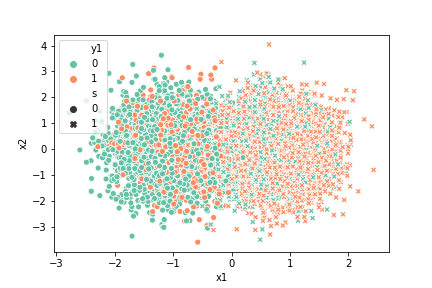


Scenario 4, Original Data Joint plot - Target 1


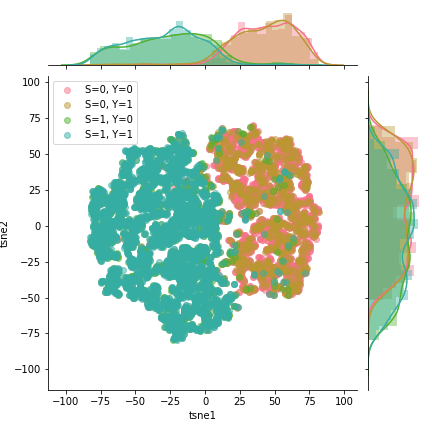


Scenario 4, Strategy 1 Learnt Representation, trained on target 1, legend for target 1


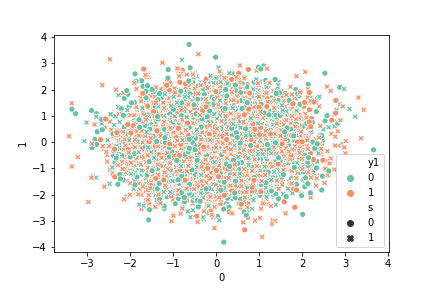


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 1, legend for target 1


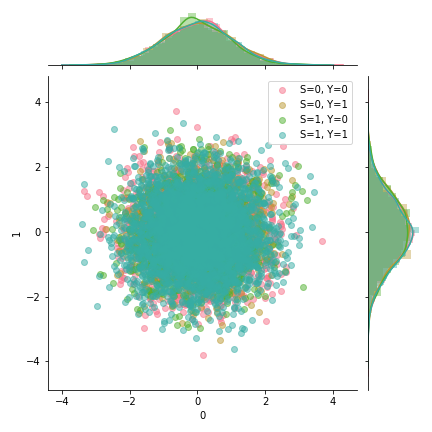


Scenario 4, Strategy 1 Learnt Representation, trained on target 1, legend for target 2


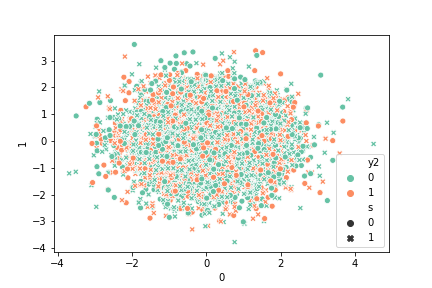


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 1, legend for target 2


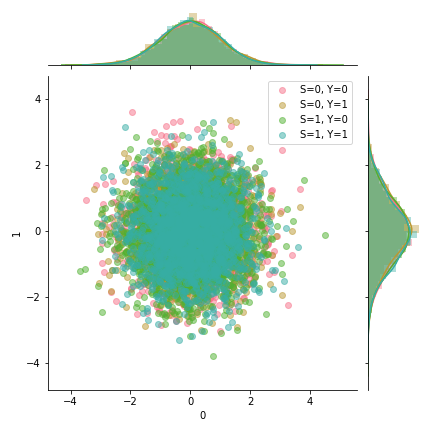


Scenario 4, Strategy 1 Learnt Representation, trained on target 1, legend for target 3


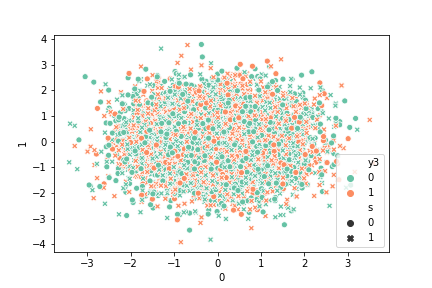


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 1, legend for target 3


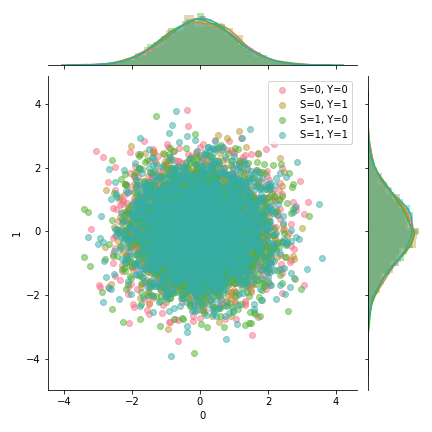

Scenario 4, Original Data - Target 2


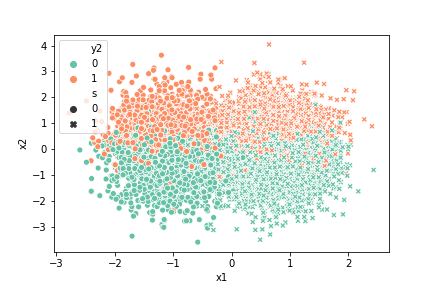


Scenario 4, Original Data Joint plot - Target 2


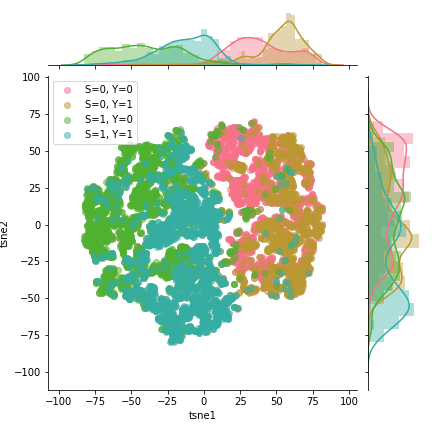


Scenario 4, Strategy 1 Learnt Representation, trained on target 2, legend for target 1


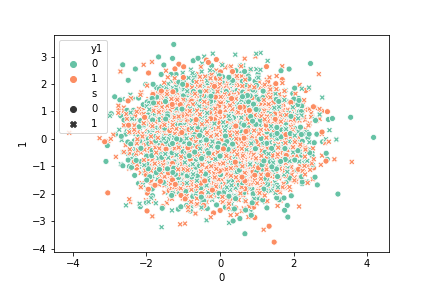


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 2, legend for target 1


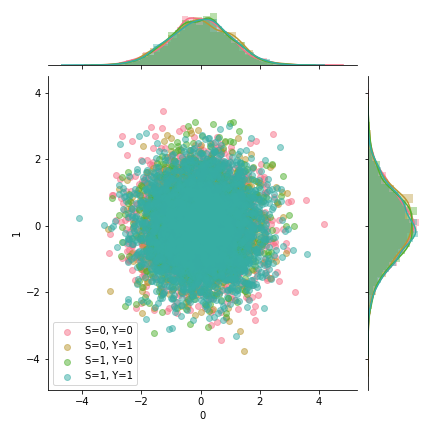


Scenario 4, Strategy 1 Learnt Representation, trained on target 2, legend for target 2


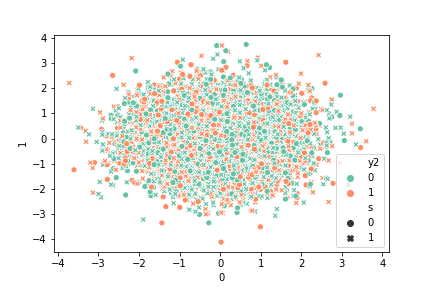


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 2, legend for target 2


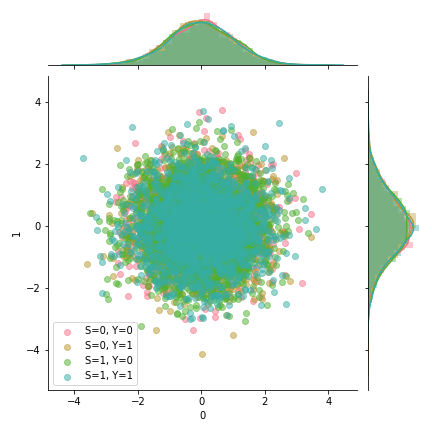


Scenario 4, Strategy 1 Learnt Representation, trained on target 2, legend for target 3


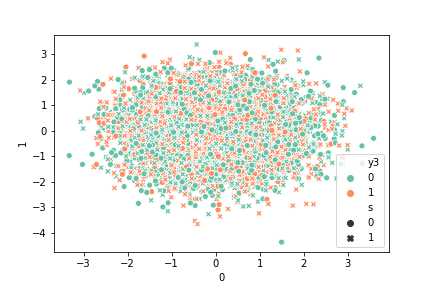


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 2, legend for target 3


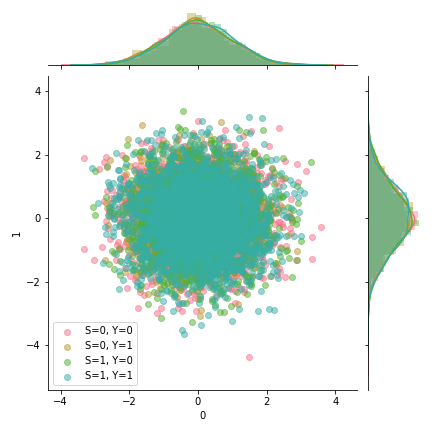

Scenario 4, Original Data - Target 3


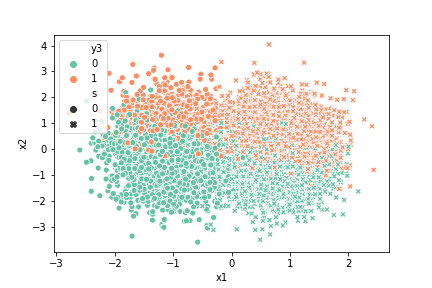


Scenario 4, Original Data Joint plot - Target 3


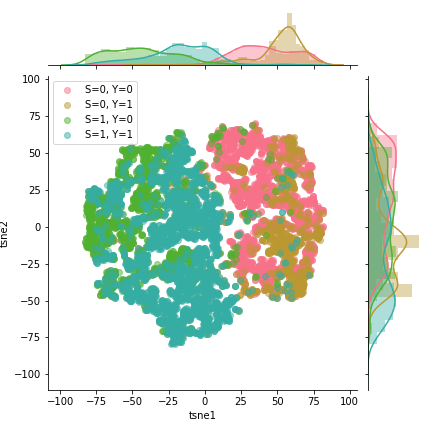


Scenario 4, Strategy 1 Learnt Representation, trained on target 3, legend for target 1


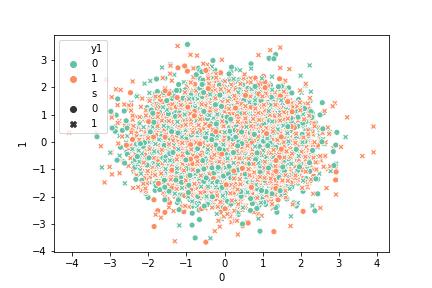


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 3, legend for target 1


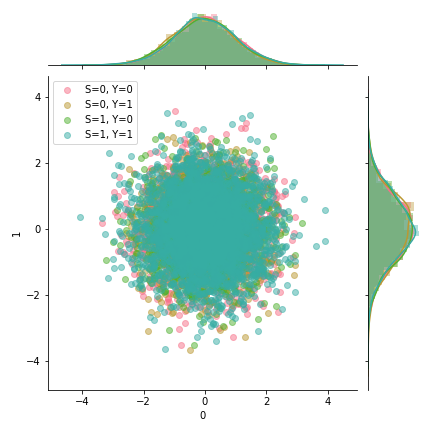


Scenario 4, Strategy 1 Learnt Representation, trained on target 3, legend for target 2


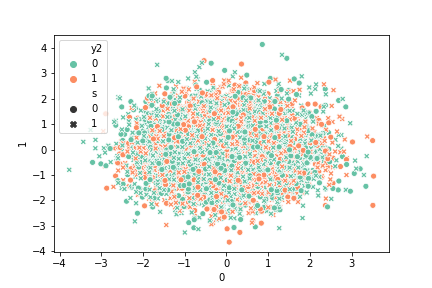


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 3, legend for target 2


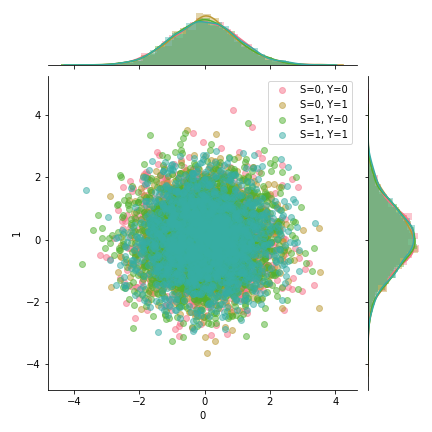


Scenario 4, Strategy 1 Learnt Representation, trained on target 3, legend for target 3


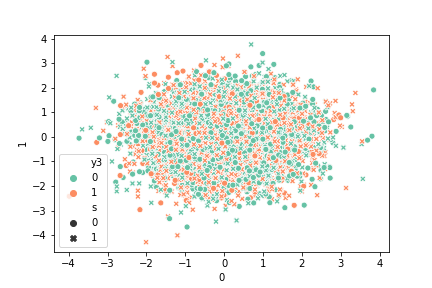


Scenario 4, Stategy 1 Joint Plot of Representation, trained on target 3, legend for target 3


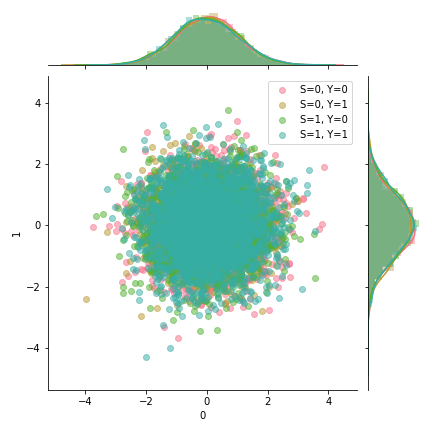

In [11]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 1 Learnt Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy1_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 1 Joint Plot of Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy1_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

## Strategy 2

So the problem is that our representation doesn't have any direction. It's goal is to make $S$ unrecognizable from $Z$. Which it does, it's just that you can't tell anything else from $Z$ either.

So let's give $Z$ some direction.

![setup2](assets/setup2.png)

In this case we want $Z$ to have no information about $S$, but also be representative of $Y$.

We can re-use most of the parts from before, but we need a predictor.

In [12]:
class EmbeddingPredictor(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.hid = nn.Linear(latent_dim, latent_dim*3)
        self.hid_1 = nn.Linear(latent_dim*3, latent_dim*3)
        self.bn_1 = nn.BatchNorm1d(latent_dim*3)
        self.out = nn.Linear(latent_dim*3, 1)

    def forward(self, z: td.Distribution):
        y = self.bn_1(F.relu(self.hid(z)))
        return self.out(y)

and slightly update one of our helper functions

In [13]:
def encode2(loader: DataLoader, model: nn.Module, latent_dims: int):
    feats_train_encs: pd.DataFrame = pd.DataFrame(columns=[f"{i}" for i in range(latent_dims)])
    model.eval()
    with torch.no_grad():
        for (x, s, y) in loader:
            z, _, _ = model(x)
            feats_train_encs = pd.concat(
                [
                    feats_train_encs,
                    pd.DataFrame(z.sample().cpu().numpy(), columns=[f"{i}" for i in range(latent_dims)]),
                ],
                axis="rows",
                ignore_index=True,
            )

    return feats_train_encs

Let's build the model

In [14]:
class Model2(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.enc = FeatureEncoder(in_size, latent_dim)
        self.adv = FeatureAdv(latent_dim)
        self.pred = EmbeddingPredictor(latent_dim)

    def forward(self, x):
        z = self.enc(x)
        s = self.adv(z.rsample())
        y = self.pred(z.rsample())
        return z, s, y

In [15]:
models_strategy_2 = []
post_trains_strategy_2 = []
post_tests_strategy_2 = []

for train_target in targets:
#     models_strategy_2.insert(train_target-1, [])
    post_trains_strategy_2.insert(train_target-1, [])
    post_tests_strategy_2.insert(train_target-1, [])
    
    models_strategy_2.insert(train_target-1, Model2(len(train[train_target-1].x.columns), latent_dims))
    
    optimiser2 = Adam(models_strategy_2[train_target-1].parameters(), lr=1e-3)
    scheduler2 = lr_scheduler.ExponentialLR(optimiser2, gamma=0.98)

    models_strategy_2[train_target-1].train()

    with trange(epochs) as t:
        for epoch in t:
            for (x, s, y) in train_loaders[train_target-1]:
                z, s_pred, y_pred = models_strategy_2[train_target-1](x)

                feat_prior = td.Normal(loc=torch.zeros(latent_dims), scale=torch.ones(latent_dims))
                feat_kl_loss = td.kl.kl_divergence(z, feat_prior)

                feat_sens_loss = F.binary_cross_entropy_with_logits(s_pred, s, reduction="mean")
                pred_y_loss = F.binary_cross_entropy_with_logits(y_pred, y, reduction="mean")

                loss2 = 0.1*feat_kl_loss.mean() + 0.2*feat_sens_loss + 0.7*pred_y_loss

                t.set_postfix(loss=loss2.item())
                loss2.backward()
                optimiser2.step()
                optimiser2.zero_grad()
            scheduler2.step()
    models_strategy_2[train_target-1].eval()
    
    
    for test_target in targets:
        post_trains_strategy_2[train_target-1].insert(target-1, DataTuple(x=encode2(train_loaders[test_target-1], models_strategy_2[train_target-1], latent_dims), s=train[test_target-1].s, y=train[test_target-1].y))
        post_tests_strategy_2[train_target-1].insert(target-1, DataTuple(x=encode2(test_loaders[test_target-1], models_strategy_2[train_target-1], latent_dims), s=test[test_target-1].s, y=test[test_target-1].y))

        save_2d_plot(post_trains_strategy_2[train_target-1][test_target-1], f"./plots/strategy2_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_trains_strategy_2[train_target-1][test_target-1], f"./plots/strategy2_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_trains_strategy_2[train_target-1][test_target-1], f"./plots/strategy2_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_trains_strategy_2[train_target-1][test_target-1], f"./plots/strategy2_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

100%|██████████| 20/20 [00:05<00:00,  3.40it/s, loss=0.453]
/Users/ot44/anaconda3/envs/jb/lib/python3.7/site-packages/seaborn/axisgrid.py:1668: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [16]:
og_model_2_acc = []
og_model_2_fair = []

for train_target in targets:
    og_model_2_acc.insert(train_target-1, [])
    og_model_2_fair.insert(test_target-1, [])
    for test_target in targets:
        print(f"Performance on the embeddings trained on target {train_target}, evaluated on target {test_target}...")
        og_model_2_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_2[train_target-1][test_target-1], post_tests_strategy_2[train_target-1][test_target-1]))

        print(f"Fairness on the embeddings train on target {train_target}, evaluated on target {test_target}...")
        og_model_2_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_2[train_target-1][test_target-1], post_tests_strategy_2[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

Performance on the embeddings trained on target 1, evaluated on target 1...
Accuracy: 52.350

Fairness on the embeddings train on target 1, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target 2...
Accuracy: 62.100

Fairness on the embeddings train on target 1, evaluated on target 2...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target 3...
Accuracy: 57.600

Fairness on the embeddings train on target 1, evaluated on target 3...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target 1...
Accuracy: 52.350

Fairness on the embeddings train on target 2, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target 2...
Accuracy: 83.400

Fairness on the embedd

Well, this is certainly more accurate than before, but although were a bit more equal than in the original data, we're not really doing a great job. The reason for this is that there is a tension between removing information that is relevant to $S$ and keeping information that is relevant for $Y$. To demonstrate this, let's tweak the above model to remove this tension.

Scenario 4, Original Data - Target 1


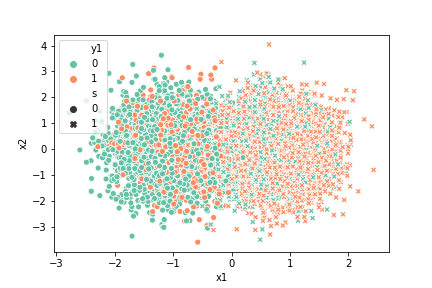


Scenario 4, Original Data Joint plot - Target 1


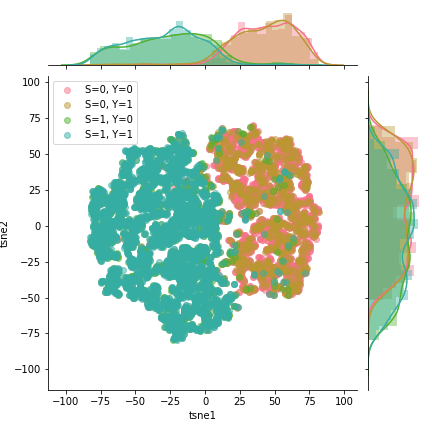


Scenario 4, Strategy 2 Learnt Representation, trained on target 1, legend for target 1


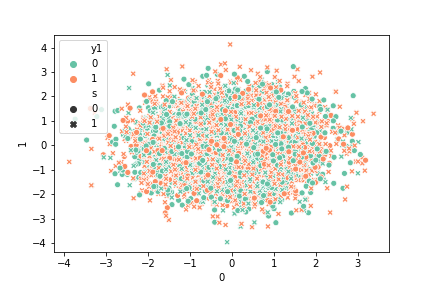


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 1, legend for target 1


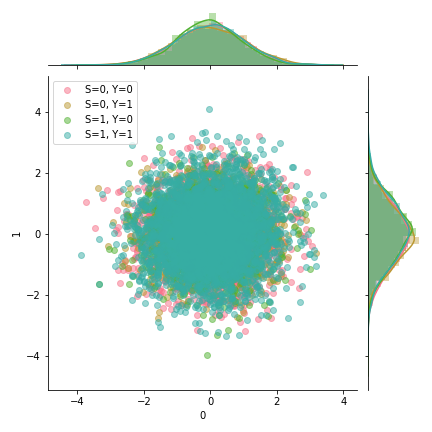


Scenario 4, Strategy 2 Learnt Representation, trained on target 1, legend for target 2


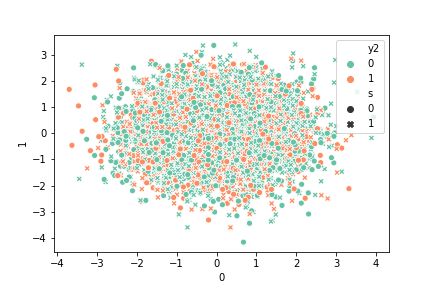


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 1, legend for target 2


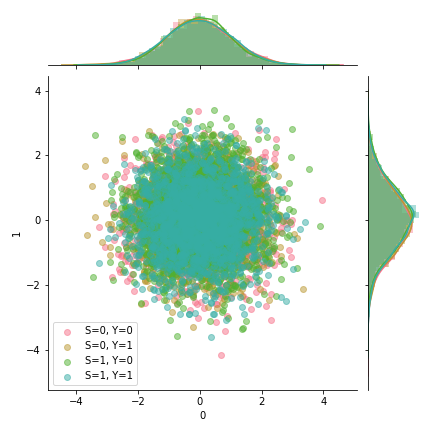


Scenario 4, Strategy 2 Learnt Representation, trained on target 1, legend for target 3


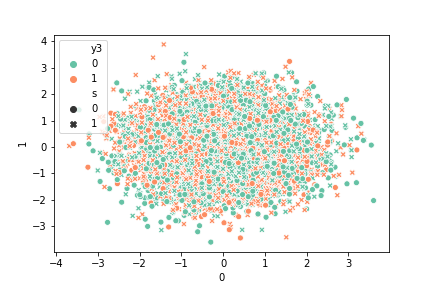


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 1, legend for target 3


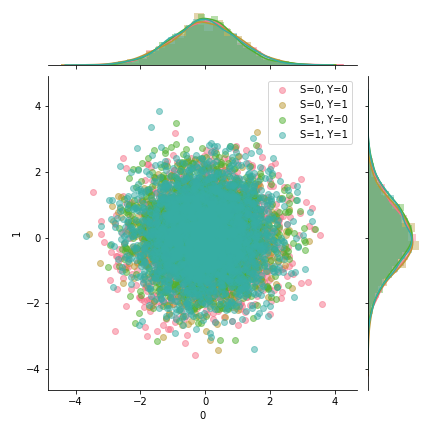

Scenario 4, Original Data - Target 2


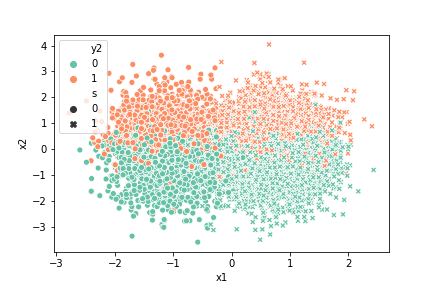


Scenario 4, Original Data Joint plot - Target 2


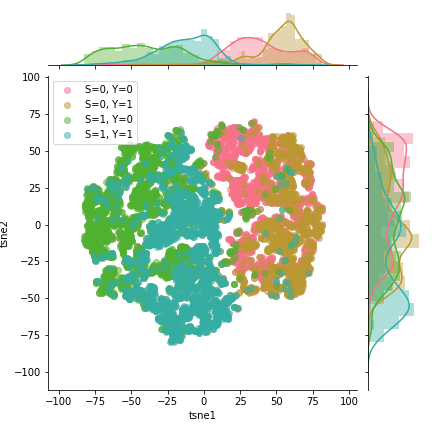


Scenario 4, Strategy 2 Learnt Representation, trained on target 2, legend for target 1


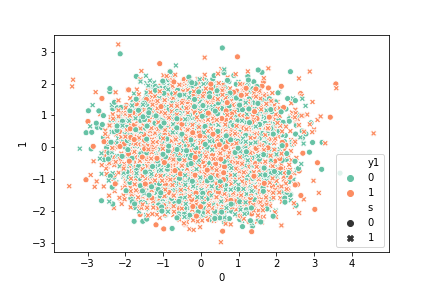


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 2, legend for target 1


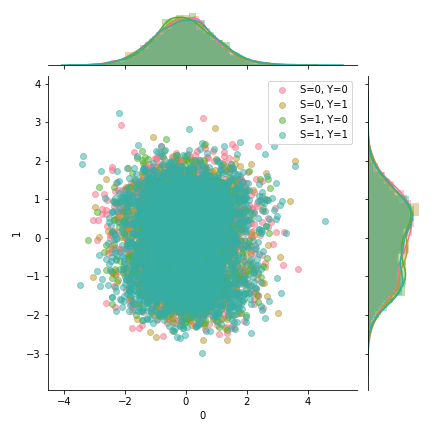


Scenario 4, Strategy 2 Learnt Representation, trained on target 2, legend for target 2


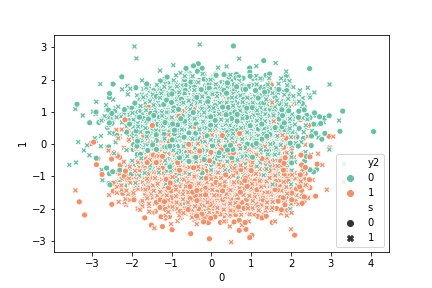


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 2, legend for target 2


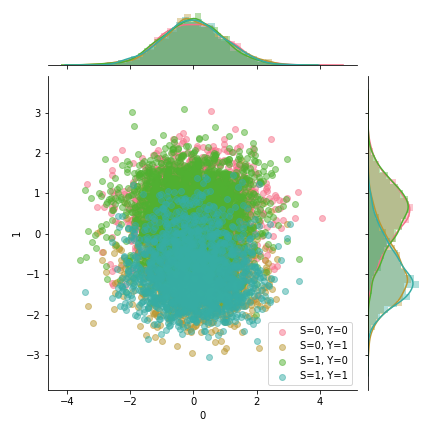


Scenario 4, Strategy 2 Learnt Representation, trained on target 2, legend for target 3


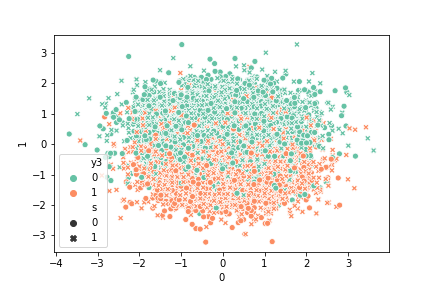


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 2, legend for target 3


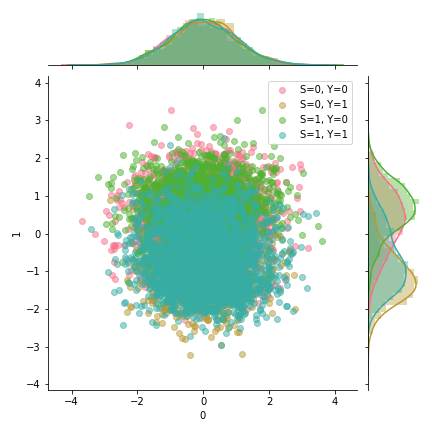

Scenario 4, Original Data - Target 3


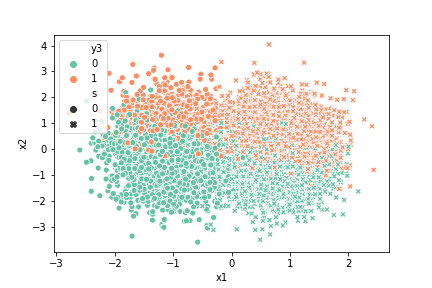


Scenario 4, Original Data Joint plot - Target 3


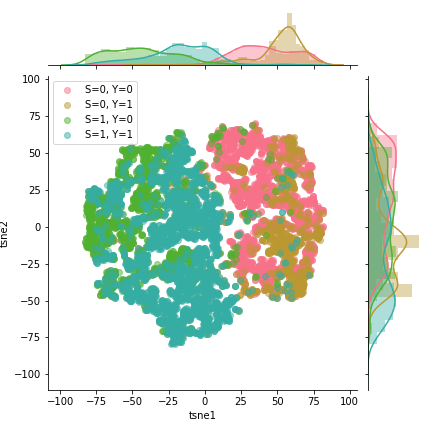


Scenario 4, Strategy 2 Learnt Representation, trained on target 3, legend for target 1


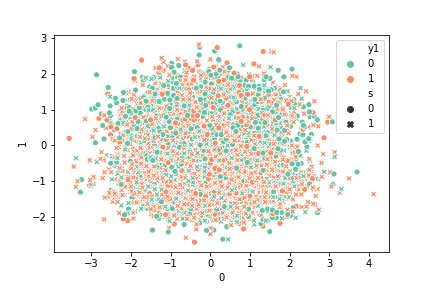


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 3, legend for target 1


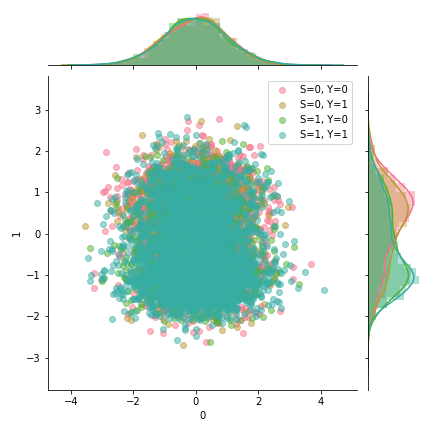


Scenario 4, Strategy 2 Learnt Representation, trained on target 3, legend for target 2


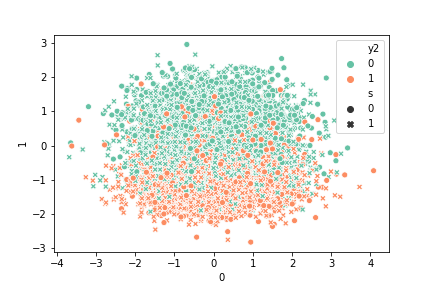


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 3, legend for target 2


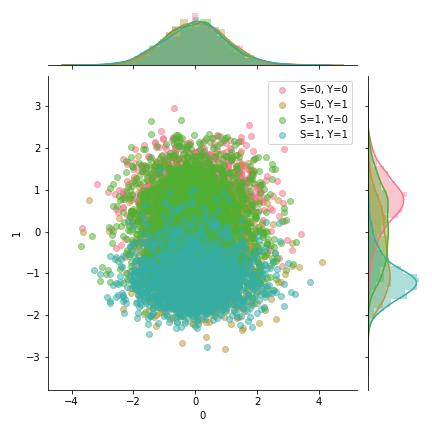


Scenario 4, Strategy 2 Learnt Representation, trained on target 3, legend for target 3


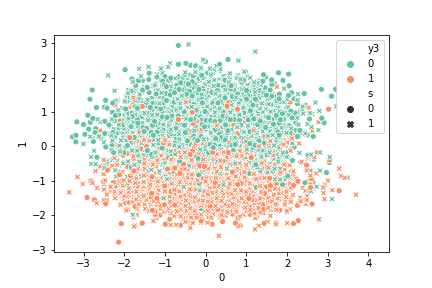


Scenario 4, Stategy 2 Joint Plot of Representation, trained on target 3, legend for target 3


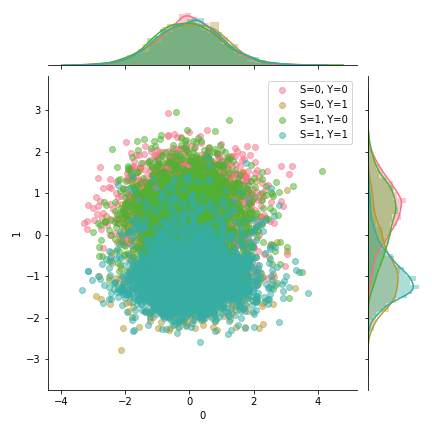

In [17]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 2 Learnt Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy2_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 2 Joint Plot of Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy2_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

## Strategy 3

![setup3](assets/setup3.png)

In this setup we remove the tension. $Z$ can freely remove $S$, and $Y$ can get all the information it needs about $S$ directly.

We'll just update the helper function.

In [18]:
def encode3(loader: DataLoader, model: nn.Module, latent_dims: int):
    feats_train_encs: pd.DataFrame = pd.DataFrame(columns=[f"{i}" for i in range(latent_dims)])
    model.eval()
    with torch.no_grad():
        for (x, s, y) in loader:
            z, _, _ = model(x, s)
            feats_train_encs = pd.concat(
                [
                    feats_train_encs,
                    pd.DataFrame(z.sample().cpu().numpy(), columns=[f"{i}" for i in range(latent_dims)]),
                ],
                axis="rows",
                ignore_index=True,
            )

    return feats_train_encs

And both the predictor and the model

In [19]:
class EmbeddingAndSPredictor(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.hid = nn.Linear(latent_dim+1, latent_dim*3)
        self.hid_1 = nn.Linear(latent_dim*3, latent_dim*3)
        self.bn_1 = nn.BatchNorm1d(latent_dim*3)
        self.out = nn.Linear(latent_dim*3, 1)

    def forward(self, z: td.Distribution, s: torch.Tensor):
        y = self.bn_1(F.relu(self.hid(torch.cat([z, s], dim=1))))
        return self.out(y)

class Model3(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.enc = FeatureEncoder(in_size, latent_dim)
        self.adv = FeatureAdv(latent_dim)
        self.pred = EmbeddingAndSPredictor(latent_dim)

    def forward(self, x, s):
        z = self.enc(x)
        z_sample  = z.rsample()
        s_pred = self.adv(z_sample)
        y = self.pred(z_sample, s)
        return z, s_pred, y

In [20]:
models_strategy_3 = []
post_trains_strategy_3 = []
post_tests_strategy_3 = []

for train_target in targets:
#     models_strategy_3.insert(train_target-1, [])
    post_trains_strategy_3.insert(train_target-1, [])
    post_tests_strategy_3.insert(train_target-1, [])
    
    models_strategy_3.insert(train_target-1, Model3(len(train[train_target-1].x.columns), latent_dims))
    
    optimiser3 = Adam(models_strategy_3[train_target-1].parameters(), lr=1e-3)
    scheduler3 = lr_scheduler.ExponentialLR(optimiser3, gamma=0.98)

    models_strategy_3[train_target-1].train()

    with trange(epochs) as t:
        for epoch in t:
            for (x, s, y) in train_loaders[train_target-1]:
                z, s_pred, y_pred = models_strategy_3[train_target-1](x, s)

                feat_prior = td.Normal(loc=torch.zeros(latent_dims), scale=torch.ones(latent_dims))
                feat_kl_loss = td.kl.kl_divergence(z, feat_prior)

                feat_sens_loss = F.binary_cross_entropy_with_logits(s_pred, s, reduction="mean")
                pred_y_loss = F.binary_cross_entropy_with_logits(y_pred, y, reduction="mean")

                loss3 = 0.1*feat_kl_loss.mean() + 0.2*feat_sens_loss + 0.7*pred_y_loss

                t.set_postfix(loss=loss3.item())
                loss3.backward()
                optimiser3.step()
                optimiser3.zero_grad()
            scheduler3.step()
    models_strategy_3[train_target-1].eval()

    for test_target in targets:
        post_trains_strategy_3[train_target-1].insert(test_target-1, DataTuple(x=encode3(train_loaders[test_target-1], models_strategy_3[train_target-1], latent_dims), s=train[test_target-1].s, y=train[test_target-1].y))
        post_tests_strategy_3[train_target-1].insert(test_target-1, DataTuple(x=encode3(test_loaders[test_target-1], models_strategy_3[train_target-1], latent_dims), s=test[test_target-1].s, y=test[test_target-1].y))

        save_2d_plot(post_trains_strategy_3[train_target-1][test_target-1], f"./plots/strategy3_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_trains_strategy_3[train_target-1][test_target-1], f"./plots/strategy3_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_trains_strategy_3[train_target-1][test_target-1], f"./plots/strategy3_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_trains_strategy_3[train_target-1][test_target-1], f"./plots/strategy3_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

100%|██████████| 20/20 [00:05<00:00,  3.83it/s, loss=0.435]
/Users/ot44/anaconda3/envs/jb/lib/python3.7/site-packages/seaborn/axisgrid.py:1668: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [21]:
og_model_3_acc = []
og_model_3_fair = []

for train_target in targets:
    og_model_3_acc.insert(train_target-1, [])
    og_model_3_fair.insert(test_target-1, [])
    for test_target in targets:
        print(f"Performance on the embeddings trained on target {train_target}, evaluated on target{test_target}...")
        og_model_3_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_3[train_target-1][test_target-1], post_tests_strategy_3[train_target-1][test_target-1]))

        print(f"Fairness on the embeddings train on target {train_target}, evaluated on target {test_target}...")
        og_model_3_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_3[train_target-1][test_target-1], post_tests_strategy_3[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

Performance on the embeddings trained on target 1, evaluated on target1...
Accuracy: 52.350

Fairness on the embeddings train on target 1, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target2...
Accuracy: 62.100

Fairness on the embeddings train on target 1, evaluated on target 2...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 1, evaluated on target3...
Accuracy: 57.600

Fairness on the embeddings train on target 1, evaluated on target 3...
prob_pos: {'s_1': 0.0, 's_0': 0.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target1...
Accuracy: 52.350

Fairness on the embeddings train on target 2, evaluated on target 1...
prob_pos: {'s_1': 100.0, 's_0': 100.0}, {'s_0-s_1': 0.0}

Performance on the embeddings trained on target 2, evaluated on target2...
Accuracy: 83.350

Fairness on the embeddings 

This is in line with our understanding - we lose a bit more accuracy, but the probability of a positive outcome is more equal across the groups. This would probably get closer to parity if we had either a more complicated model, or trained for longer.

Scenario 4, Original Data - Target 1


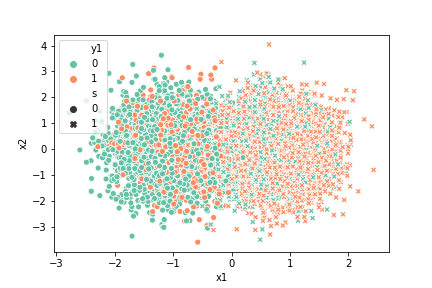


Scenario 4, Original Data Joint plot - Target 1


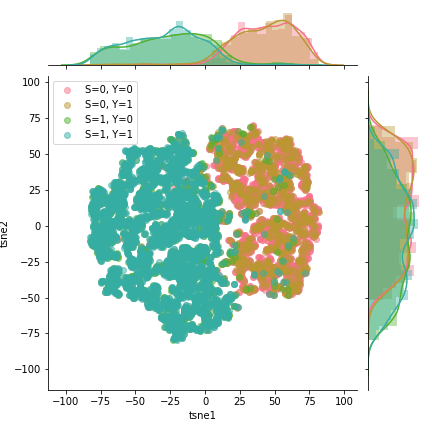


Scenario 4, Strategy 3 Learnt Representation, trained on target 1, legend for target 1


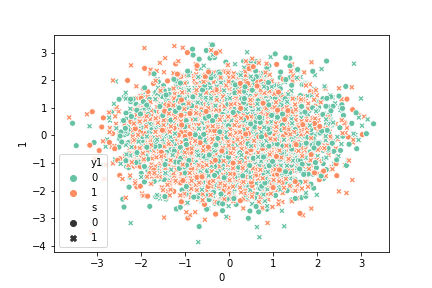


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 1, legend for target 1


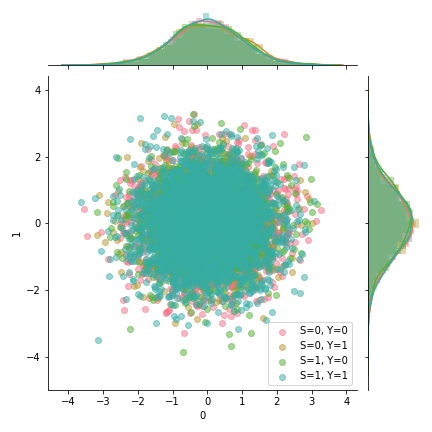


Scenario 4, Strategy 3 Learnt Representation, trained on target 1, legend for target 2


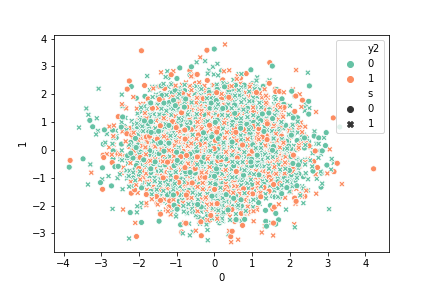


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 1, legend for target 2


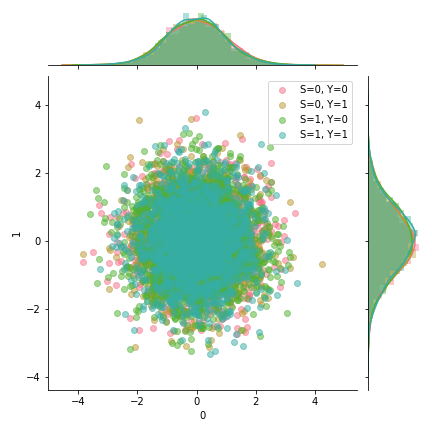


Scenario 4, Strategy 3 Learnt Representation, trained on target 1, legend for target 3


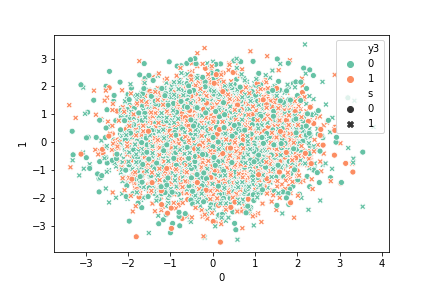


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 1, legend for target 3


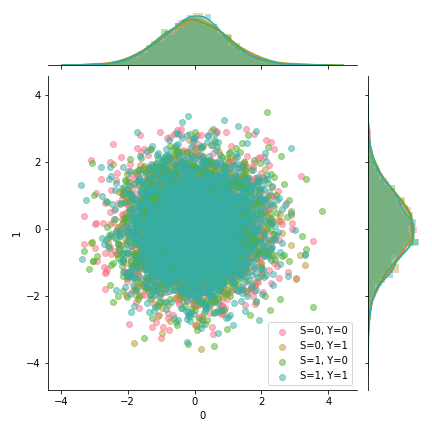

Scenario 4, Original Data - Target 2


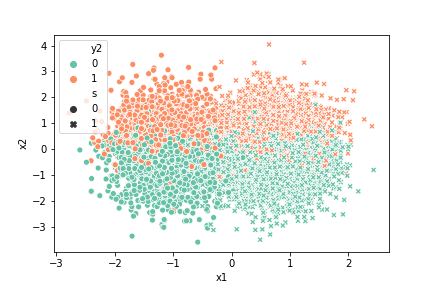


Scenario 4, Original Data Joint plot - Target 2


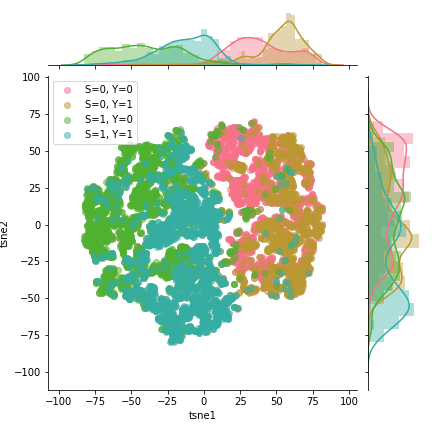


Scenario 4, Strategy 3 Learnt Representation, trained on target 2, legend for target 1


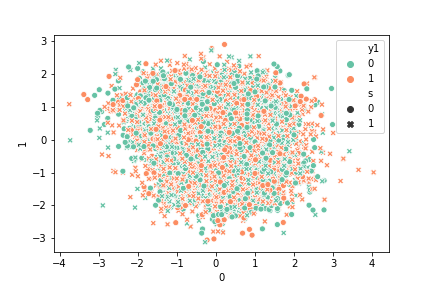


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 2, legend for target 1


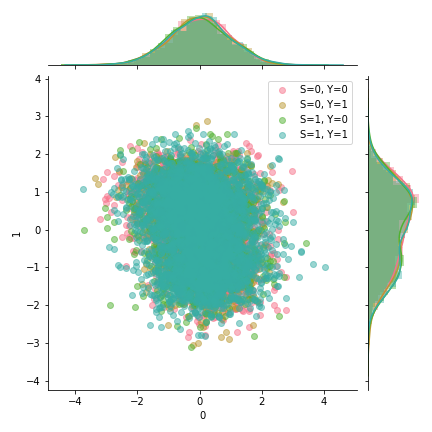


Scenario 4, Strategy 3 Learnt Representation, trained on target 2, legend for target 2


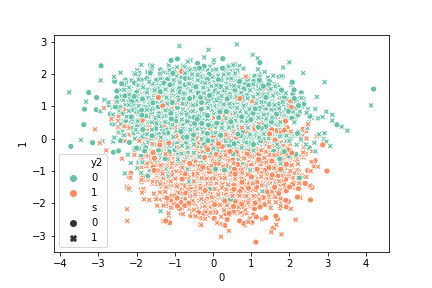


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 2, legend for target 2


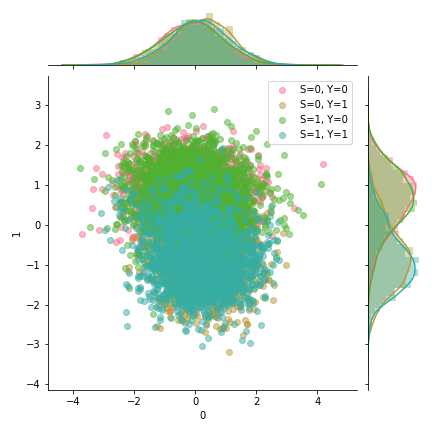


Scenario 4, Strategy 3 Learnt Representation, trained on target 2, legend for target 3


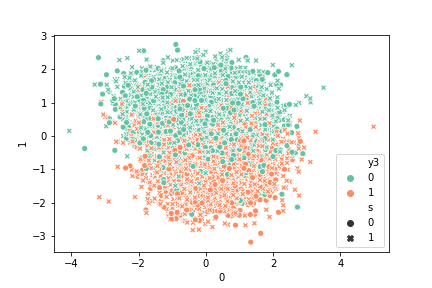


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 2, legend for target 3


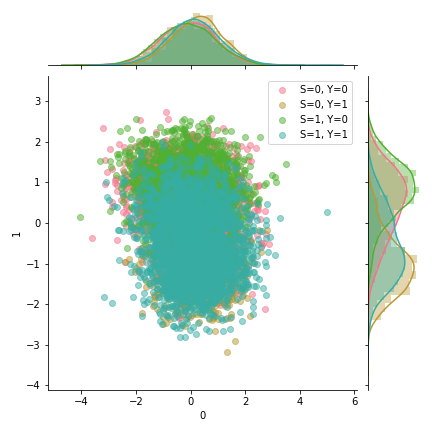

Scenario 4, Original Data - Target 3


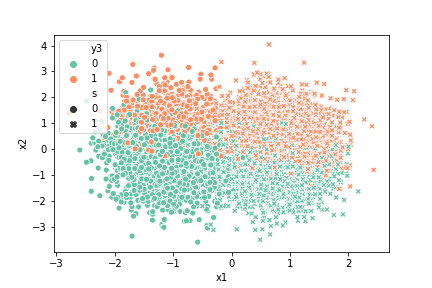


Scenario 4, Original Data Joint plot - Target 3


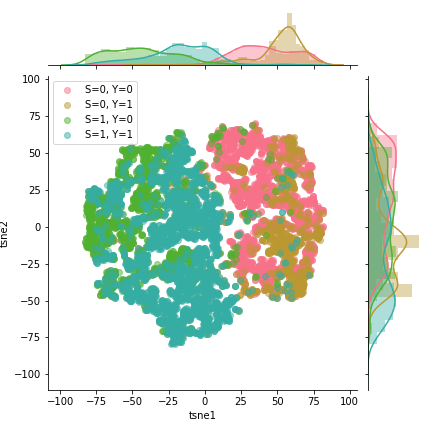


Scenario 4, Strategy 3 Learnt Representation, trained on target 3, legend for target 1


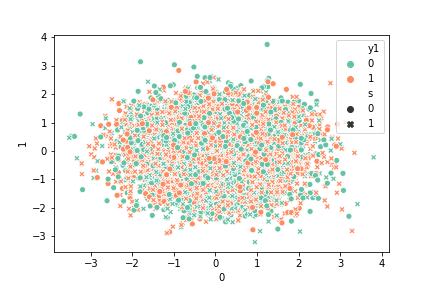


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 3, legend for target 1


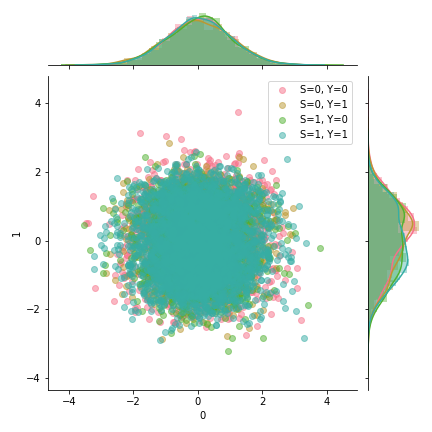


Scenario 4, Strategy 3 Learnt Representation, trained on target 3, legend for target 2


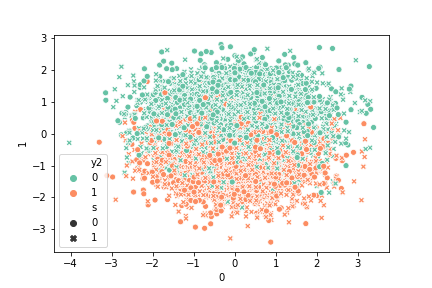


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 3, legend for target 2


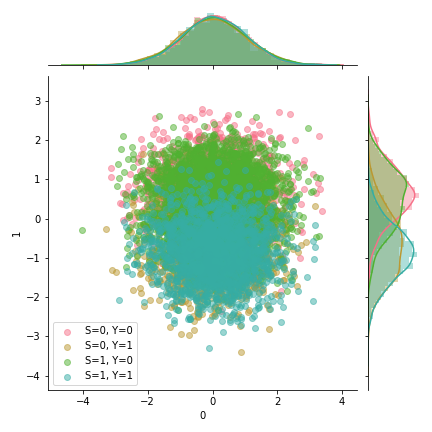


Scenario 4, Strategy 3 Learnt Representation, trained on target 3, legend for target 3


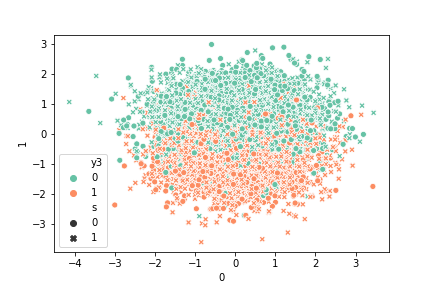


Scenario 4, Stategy 3 Joint Plot of Representation, trained on target 3, legend for target 3


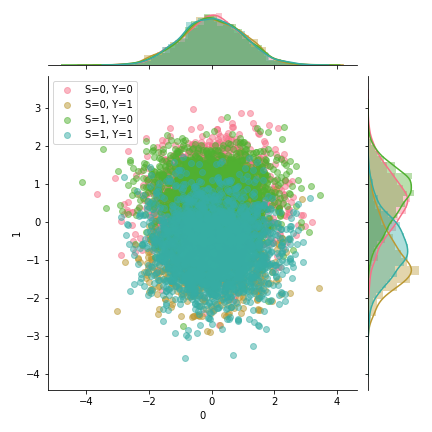

In [22]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 3 Learnt Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy3_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 3 Joint Plot of Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy3_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

## Happy Days

Well, this is all quite positive. What's the problem?

There are 2.

1. We've only learnt a fair representation that's any use __as long as you want to predct $Y$__. If you wanted to learn some other label from your data, then this representation isn't going to help that much. We'll pick up on this later.
2. The removal of $S$ is only as good as the model we used to remove it. Let's demonstrate this.

Let's build a "shallow" version of our model.

In [23]:
class ShallowFeatureEncoder(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.mu = nn.Linear(in_size, latent_dim)
        self.logvar = nn.Linear(in_size, latent_dim)

    def forward(self, x: torch.Tensor):
        return td.Normal(loc=self.mu(x), scale=F.softplus(self.logvar(x)))
    
class ShallowFeatureAdv(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.out = nn.Linear(latent_dim, 1)

    def forward(self, z: td.Distribution):
        return self.out(grad_reverse(z))
    
class ShallowEmbeddingAndSPredictor(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.out = nn.Linear(latent_dim+1, 1)

    def forward(self, z: td.Distribution, s: torch.Tensor):
        return self.out(torch.cat([z, s], dim=1))
    
class Model4(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.enc = FeatureEncoder(in_size, latent_dim)
        self.adv = ShallowFeatureAdv(latent_dim)
        self.pred = EmbeddingAndSPredictor(latent_dim)

    def forward(self, x, s):
        z = self.enc(x)
        z_sample  = z.rsample()
        s_pred = self.adv(z_sample)
        y = self.pred(z_sample, s)
        return z, s_pred, y

In [24]:
models_strategy_4 = []
post_trains_strategy_4 = []
post_tests_strategy_4 = []

for train_target in targets:
    post_trains_strategy_4.insert(train_target-1, [])
    post_tests_strategy_4.insert(train_target-1, [])

    models_strategy_4.insert(train_target-1, Model4(len(train[train_target-1].x.columns), latent_dims))
    optimiser4 = Adam(models_strategy_4[train_target-1].parameters(), lr=1e-3)
    scheduler4 = lr_scheduler.ExponentialLR(optimiser4, gamma=0.98)

    models_strategy_4[train_target-1].train()

    with trange(epochs) as t:
        for epoch in t:
            for (x, s, y) in train_loaders[train_target-1]:
                z, s_pred, y_pred = models_strategy_4[train_target-1](x, s)

                feat_prior = td.Normal(loc=torch.zeros(latent_dims), scale=torch.ones(latent_dims))
                feat_kl_loss = td.kl.kl_divergence(z, feat_prior)

                feat_sens_loss = F.binary_cross_entropy_with_logits(s_pred, s, reduction="mean")
                pred_y_loss = F.binary_cross_entropy_with_logits(y_pred, y, reduction="mean")

                loss4 = 0.1*feat_kl_loss.mean() + 0.2*feat_sens_loss + 0.7*pred_y_loss

                t.set_postfix(loss=loss4.item())
                loss4.backward()
                optimiser4.step()
                optimiser4.zero_grad()
            scheduler4.step()
    models_strategy_4[train_target-1].eval()

    
    for test_target in targets:
        post_trains_strategy_4[train_target-1].insert(test_target-1, DataTuple(x=encode3(train_loaders[test_target-1], models_strategy_4[train_target-1], latent_dims), s=train[test_target-1].s, y=train[test_target-1].y))
        post_tests_strategy_4[train_target-1].insert(test_target-1, DataTuple(x=encode3(test_loaders[test_target-1], models_strategy_4[train_target-1], latent_dims), s=test[test_target-1].s, y=test[test_target-1].y))

        save_2d_plot(post_trains_strategy_4[train_target-1][test_target-1], f"./plots/strategy4_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_trains_strategy_4[train_target-1][test_target-1], f"./plots/strategy4_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_trains_strategy_4[train_target-1][test_target-1], f"./plots/strategy4_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_trains_strategy_4[train_target-1][test_target-1], f"./plots/strategy4_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

100%|██████████| 20/20 [00:04<00:00,  4.34it/s, loss=0.456]
/Users/ot44/anaconda3/envs/jb/lib/python3.7/site-packages/seaborn/axisgrid.py:1668: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [25]:
og_model_4_acc = []
og_model_4_fair = []

for train_target in targets:
    og_model_4_acc.insert(train_target-1, [])
    og_model_4_fair.insert(test_target-1, [])
    for test_target in targets:
        print(f"Performance on the embeddings trained on target {train_target}, evaluated on target{test_target}...")
        og_model_4_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_4[train_target-1][train_target-1], post_tests_strategy_4[train_target-1][test_target-1]))

        print(f"Fairness on the embeddings train on target {train_target}, evaluated on target {test_target}...")
        og_model_4_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_4[train_target-1][train_target-1], post_tests_strategy_4[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

Performance on the embeddings trained on target 1, evaluated on target1...
Accuracy: 56.000

Fairness on the embeddings train on target 1, evaluated on target 1...
prob_pos: {'s_1': 77.425, 's_0': 51.368}, {'s_0-s_1': 26.057}

Performance on the embeddings trained on target 1, evaluated on target2...
Accuracy: 46.450

Fairness on the embeddings train on target 1, evaluated on target 2...
prob_pos: {'s_1': 79.682, 's_0': 48.507}, {'s_0-s_1': 31.175}

Performance on the embeddings trained on target 1, evaluated on target3...
Accuracy: 51.400

Fairness on the embeddings train on target 1, evaluated on target 3...
prob_pos: {'s_1': 79.933, 's_0': 52.736}, {'s_0-s_1': 27.197}

Performance on the embeddings trained on target 2, evaluated on target1...
Accuracy: 48.250

Fairness on the embeddings train on target 2, evaluated on target 1...
prob_pos: {'s_1': 36.957, 's_0': 39.552}, {'s_0-s_1': 2.596}

Performance on the embeddings trained on target 2, evaluated on target2...
Accuracy: 82.900



Scenario 4, Original Data - Target 1


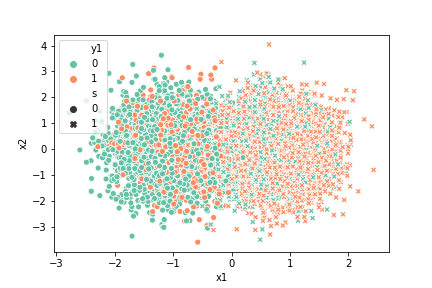


Scenario 4, Original Data Joint plot - Target 1


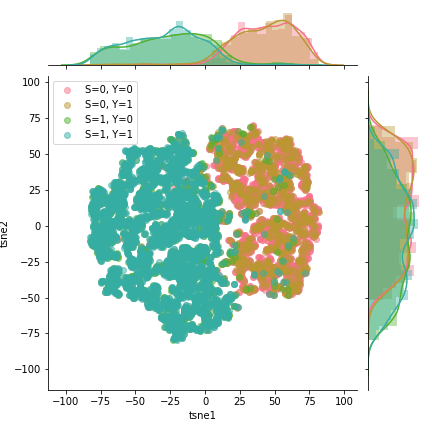


Scenario 4, Strategy 4 Learnt Representation, trained on target 1, legend for target 1


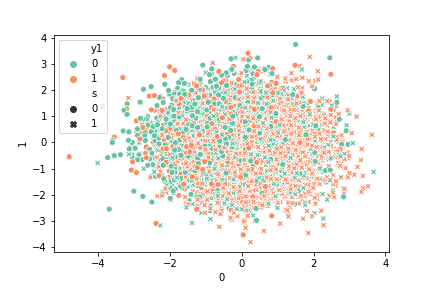


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 1, legend for target 1


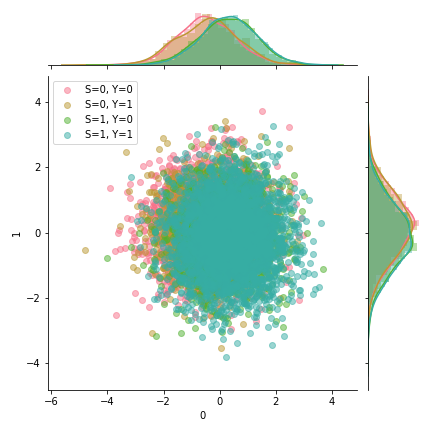


Scenario 4, Strategy 4 Learnt Representation, trained on target 1, legend for target 2


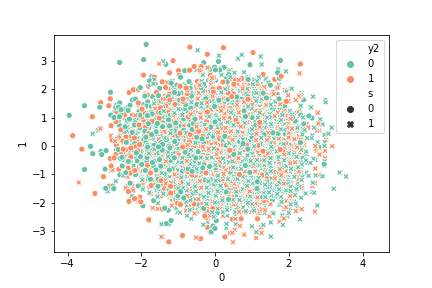


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 1, legend for target 2


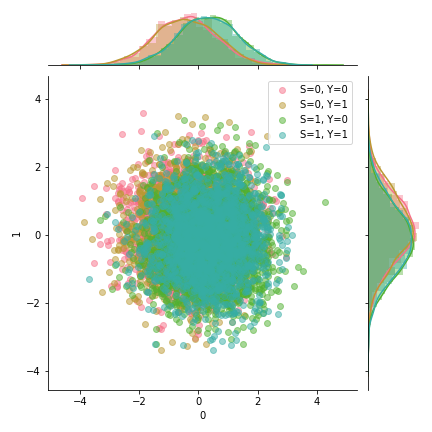


Scenario 4, Strategy 4 Learnt Representation, trained on target 1, legend for target 3


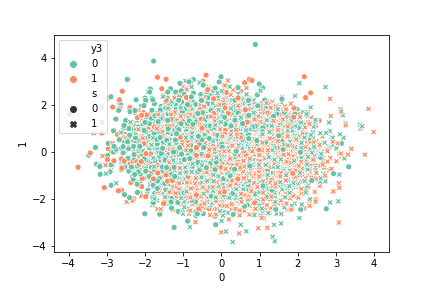


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 1, legend for target 3


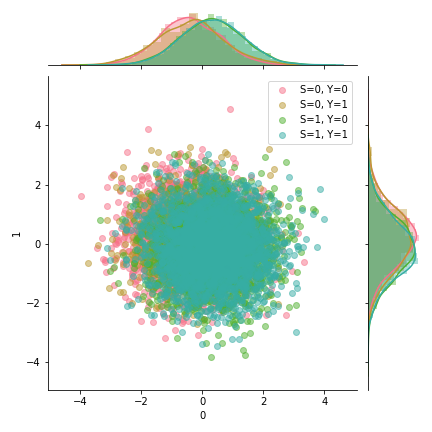

Scenario 4, Original Data - Target 2


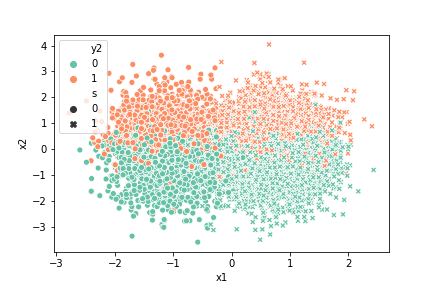


Scenario 4, Original Data Joint plot - Target 2


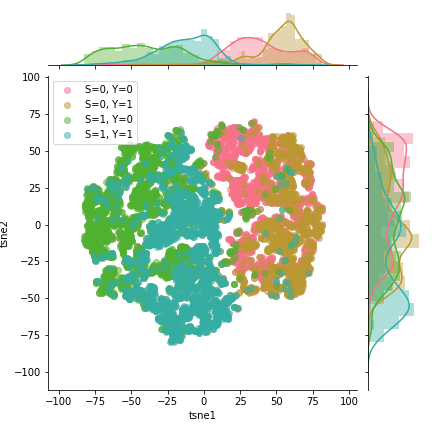


Scenario 4, Strategy 4 Learnt Representation, trained on target 2, legend for target 1


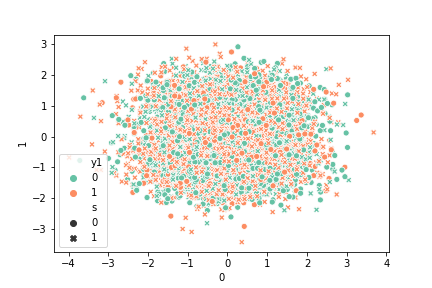


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 2, legend for target 1


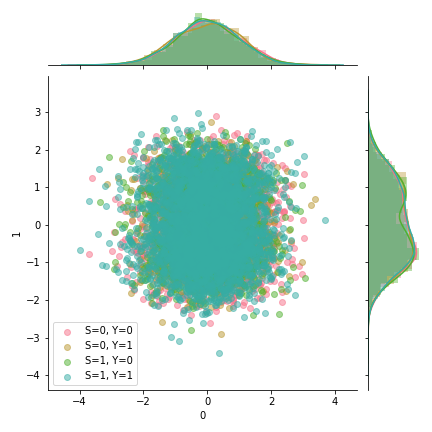


Scenario 4, Strategy 4 Learnt Representation, trained on target 2, legend for target 2


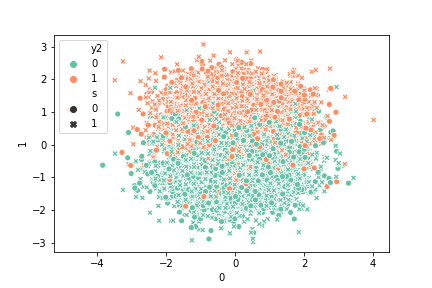


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 2, legend for target 2


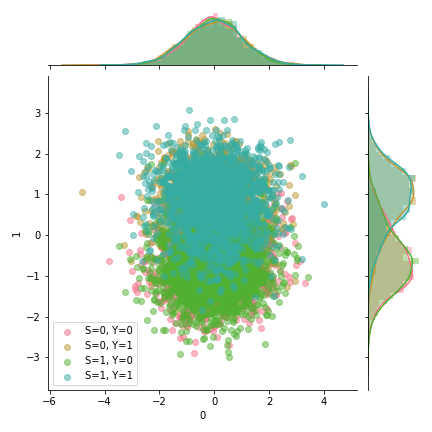


Scenario 4, Strategy 4 Learnt Representation, trained on target 2, legend for target 3


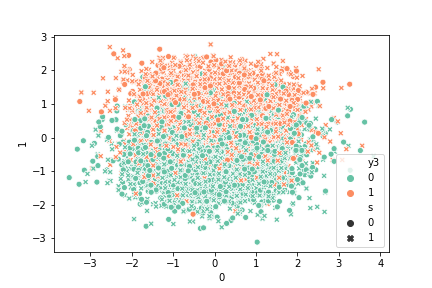


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 2, legend for target 3


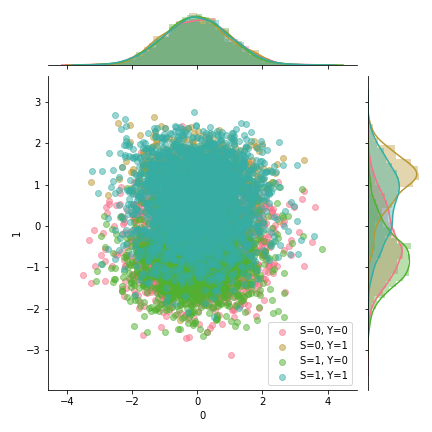

Scenario 4, Original Data - Target 3


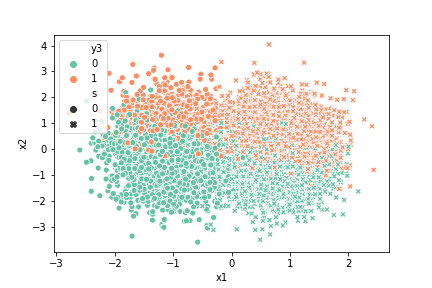


Scenario 4, Original Data Joint plot - Target 3


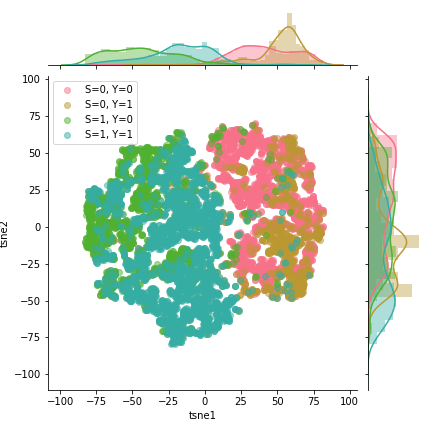


Scenario 4, Strategy 4 Learnt Representation, trained on target 3, legend for target 1


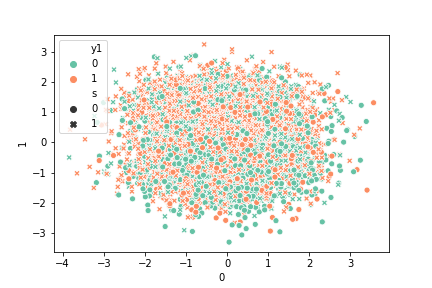


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 3, legend for target 1


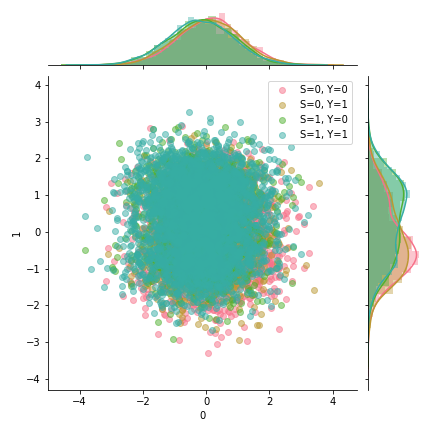


Scenario 4, Strategy 4 Learnt Representation, trained on target 3, legend for target 2


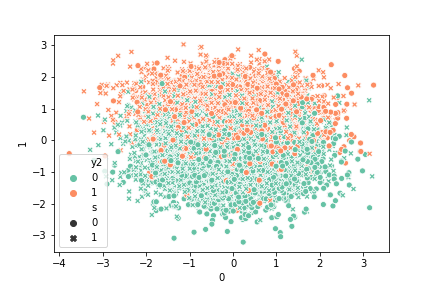


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 3, legend for target 2


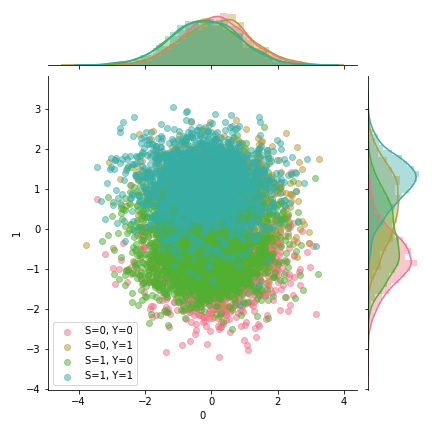


Scenario 4, Strategy 4 Learnt Representation, trained on target 3, legend for target 3


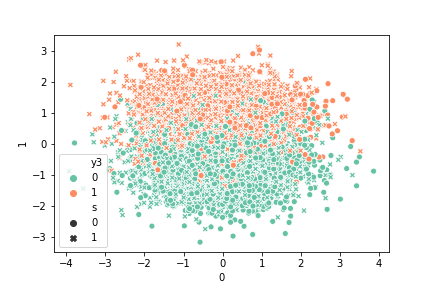


Scenario 4, Stategy 4 Joint Plot of Representation, trained on target 3, legend for target 3


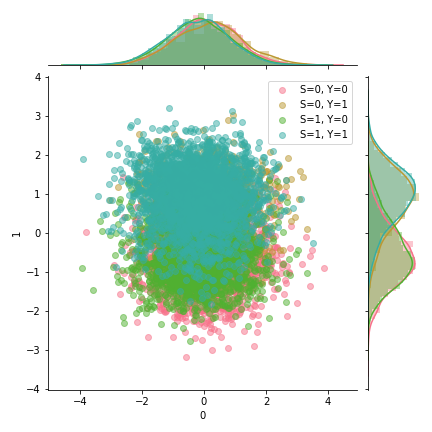

In [27]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 4 Learnt Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy4_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 4 Joint Plot of Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/strategy4_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

## Generalisations to the real world

Let's suppose that we now deploy our model into a world where the effect of the sensitive attribute doesn't exist.

In [ ]:
dataset_big = []
data_big = []
dataset_fair = []
data_fair = []
train_fair = []
test_fair = []
train_data_fair = []
train_loader_fair = []
test_data_fair = []
test_loader_fair = []
for target in targets:
    dataset_big.insert(target-1, synthetic(scenario=scenario, num_samples=10_000, fair=False))
    data_big.insert(target-1, dataset_big[target-1].load())

    dataset_fair.insert(target-1, synthetic(scenario=scenario, num_samples=10_000, fair=True))

    _data_fair = dataset_fair[target-1].load()
    _data_fair = DataTuple(x=data_big[target-1].x, s=data_big[target-1].s, y=_data_fair.y)
    scaler = StandardScaler()
    _data_fair, _ = scale_continuous(dataset_big[target-1], _data_fair, scaler)
    data_fair.insert(target-1, _data_fair)

    _train_fair, _test_fair = train_test_split(data_fair[target-1], train_percentage=0.8)
    train_fair.insert(target-1, _train_fair) 
    train_data_fair.insert(target-1, CustomDataset(_train_fair))
    train_loader_fair.insert(target-1, DataLoader(train_data_fair[target-1], batch_size=256))

    test_data_fair.insert(target-1, CustomDataset(_test_fair))
    test_fair.insert(target-1, _test_fair)
    test_loader_fair.insert(target-1, DataLoader(test_data_fair[target-1], batch_size=256))

    save_2d_plot(_train_fair, f"./plots/fair_train_scenario_{scenario}_target_{target}.png")
    save_2d_plot(DataTuple(x=_train_fair.x[["x1", "x2"]], s=_train_fair.s, y=_train_fair.y), f"./plots/fair_train_priv_scenario_{scenario}_target_{target}.png")
    save_jointplot(_train_fair, f"./plots/fair_train_joint_scenario_{scenario}_target_{target}.png")
    save_multijointplot(_train_fair, f"./plots/fair_train_multijoint_scenario_{scenario}_target_{target}.png")
    save_label_plot(_train_fair, f"./plots/fair_train_labels_scenario_{scenario}_target_{target}.png")

In [ ]:
for target in targets:
    print(f"Scenario {scenario}, Original Data - Target {target}")
    display(Image(filename=f"./plots/train_labels_scenario_{scenario}_target_{target}.png"))

    print(f"\nScenario {scenario}, Fair Data: Label Proportions - target {target}")
    display(Image(filename=f"./plots/fair_train_labels_scenario_{scenario}_target_{target}.png"))

In [ ]:
fair_original_acc = []
fair_maj_acc = []
fair_maj_fair = []
fair_random_acc = []
fair_original_fair = []
fair_maj_fair = []
fair_random_fair = []

for train_target in targets:
    fair_original_acc.insert(train_target-1, [])
    fair_maj_acc.insert(train_target-1, [])
    fair_random_acc.insert(train_target-1, [])
    fair_original_fair.insert(train_target-1, [])
    fair_maj_fair.insert(train_target-1, [])
    fair_random_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance on the original data trained with target {train_target}, evaluated on target {test_target}...")
        fair_original_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1]))

        print(f"Majority classifier trained with target {train_target}, evaluated on target {test_target}...")
        fair_maj_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1], model=Majority))

        print(f"Random classifier trained with target {train_target}, evaluated on target {test_target}...")
        fair_random_acc[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1], model=Blind))

        print(f"Fairness on the original data trained with target {train_target}, evaluated on target {test_target}...")
        fair_original_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1], metric=ProbPos, per_sens=True))

        print(f"Fairness on the original data with a majority classifier trained with target {train_target}, evaluated on target {test_target}...")
        fair_maj_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1], model=Majority, metric=ProbPos, per_sens=True))

        print(f"Fairness on the original data with a random classifier trained with target {train_target}, evaluated on target {test_target}...")
        fair_random_fair[train_target-1].insert(test_target-1, evaluate_z(train[train_target-1], test_fair[test_target-1], model=Blind, metric=ProbPos, per_sens=True))

In [ ]:
post_train1_fair = []
post_test1_fair = []
for train_target in targets:
    post_train1_fair.insert(train_target-1, [])
    post_test1_fair.insert(test_target-1, [])
    for test_target in targets:
        post_train1_fair[train_target-1].insert(test_target-1, DataTuple(x=encode1(train_loader_fair[test_target-1], models_strategy_1[train_target-1], latent_dims), s=train_fair[test_target-1].s, y=train_fair[test_target-1].y))
        post_test1_fair[train_target-1].insert(test_target-1, DataTuple(x=encode1(test_loader_fair[test_target-1], models_strategy_1[train_target-1], latent_dims), s=test_fair[test_target-1].s, y=test_fair[test_target-1].y))

        save_2d_plot(post_train1_fair[train_target-1][test_target-1], f"./plots/fair_strategy1_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_train1_fair[train_target-1][test_target-1], f"./plots/fair_strategy1_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_train1_fair[train_target-1][test_target-1], f"./plots/fair_strategy1_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_train1_fair[train_target-1][test_target-1], f"./plots/fair_strategy1_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

In [ ]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))
    
    print(f"Scenario {scenario}, Fair Data - Target {train_target}")
    display(Image(filename=f"./plots/fair_train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 4 Learnt Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy1_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 4 Joint Plot of Representation, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy1_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

In [ ]:
fair_model_1_acc = []
fair_model_1_fair = []

for train_target in targets:
    fair_model_1_acc.insert(train_target-1, [])
    fair_model_1_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance of model1 on the fair data: trained on original data with target {train_target}, evaluated on fair data with target {test_target}...")
        fair_model_1_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_1[train_target-1][test_target-1], post_test1_fair[train_target-1][test_target-1]))

        print(f"Difference in performance between the fair data and the original data: trained on {train_target}, evaluated on {test_target}")
        print(f"{(fair_model_1_acc[train_target-1][test_target-1] - og_model_1_acc[train_target-1][test_target-1]):.3f}\n")
        
        print(f"Fairness on the embeddings...")
        fair_model_1_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_1[train_target-1][test_target-1], post_test1_fair[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

        print(f"Difference in performance on the original data...")
        print(f"{(fair_model_1_fair[train_target-1][test_target-1] - og_model_1_fair[train_target-1][test_target-1])}\n")

In [ ]:
post_train2_fair = []
post_test2_fair = []
for train_target in targets:
    post_train2_fair.insert(train_target-1, [])
    post_test2_fair.insert(test_target-1, [])
    for test_target in targets:
        post_train2_fair[train_target-1].insert(test_target-1, DataTuple(x=encode2(train_loader_fair[test_target-1], models_strategy_2[train_target-1], latent_dims), s=train_fair[test_target-1].s, y=train_fair[test_target-1].y))
        post_test2_fair[train_target-1].insert(test_target-1, DataTuple(x=encode2(test_loader_fair[test_target-1], models_strategy_2[train_target-1], latent_dims), s=test_fair[test_target-1].s, y=test_fair[test_target-1].y))

        save_2d_plot(post_train2_fair[train_target-1][test_target-1], f"./plots/fair_strategy2_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_train2_fair[train_target-1][test_target-1], f"./plots/fair_strategy2_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_train2_fair[train_target-1][test_target-1], f"./plots/fair_strategy2_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_train2_fair[train_target-1][test_target-1], f"./plots/fair_strategy2_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

In [ ]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))
    
    print(f"Scenario {scenario}, Fair Data - Target {train_target}")
    display(Image(filename=f"./plots/fair_train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 4 Learnt Representation 2, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy2_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 4 Joint Plot of Representation 2, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy2_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

In [ ]:
fair_model_2_acc = []
fair_model_2_fair = []

for train_target in targets:
    fair_model_2_acc.insert(train_target-1, [])
    fair_model_2_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance of model2 on the fair data: trained on original data with target {train_target}, evaluated on fair data with target {test_target}...")
        fair_model_2_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_2[train_target-1][test_target-1], post_test2_fair[train_target-1][test_target-1]))

        print(f"Difference in performance between the fair data and the original data: trained on {train_target}, evaluated on {test_target}")
        print(f"{(fair_model_2_acc[train_target-1][test_target-1] - og_model_2_acc[train_target-1][test_target-1]):.3f}\n")
        
        print(f"Fairness on the embeddings...")
        fair_model_2_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_2[train_target-1][test_target-1], post_test2_fair[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

        print(f"Difference in performance on the original data...")
        print(f"{(fair_model_2_fair[train_target-1][test_target-1] - og_model_2_fair[train_target-1][test_target-1])}\n")

In [ ]:
post_train3_fair = []
post_test3_fair = []
for train_target in targets:
    post_train3_fair.insert(train_target-1, [])
    post_test3_fair.insert(test_target-1, [])
    for test_target in targets:
        post_train3_fair[train_target-1].insert(test_target-1, DataTuple(x=encode3(train_loader_fair[test_target-1], models_strategy_3[train_target-1], latent_dims), s=train_fair[test_target-1].s, y=train_fair[test_target-1].y))
        post_test3_fair[train_target-1].insert(test_target-1, DataTuple(x=encode3(test_loader_fair[test_target-1], models_strategy_3[train_target-1], latent_dims), s=test_fair[test_target-1].s, y=test_fair[test_target-1].y))

        save_2d_plot(post_train3_fair[train_target-1][test_target-1], f"./plots/fair_strategy3_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_train3_fair[train_target-1][test_target-1], f"./plots/fair_strategy3_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_train3_fair[train_target-1][test_target-1], f"./plots/fair_strategy3_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_train3_fair[train_target-1][test_target-1], f"./plots/fair_strategy3_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

In [ ]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))
    
    print(f"Scenario {scenario}, Fair Data - Target {train_target}")
    display(Image(filename=f"./plots/fair_train_priv_scenario_{scenario}_target_{train_target}.png"))

    print(f"\nScenario {scenario}, Original Data Joint plot - Target {train_target}")
    display(Image(filename=f"./plots/train_multijoint_scenario_{scenario}_target_{train_target}.png"))

    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 4 Learnt Representation 3, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy3_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        print(f"\nScenario {scenario}, Stategy 4 Joint Plot of Representation 3, trained on target {train_target}, legend for target {test_target}")
        display(Image(filename=f"./plots/fair_strategy3_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

In [ ]:
fair_model_3_acc = []
fair_model_3_fair = []

for train_target in targets:
    fair_model_3_acc.insert(train_target-1, [])
    fair_model_3_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance of model3 on the fair data: trained on original data with target {train_target}, evaluated on fair data with target {test_target}...")
        fair_model_3_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_3[train_target-1][test_target-1], post_test3_fair[train_target-1][test_target-1]))

        print(f"Difference in performance between the fair data and the original data: trained on {train_target}, evaluated on {test_target}")
        print(f"{(fair_model_3_acc[train_target-1][test_target-1] - og_model_3_acc[train_target-1][test_target-1]):.3f}\n")
        
        print(f"Fairness on the embeddings...")
        fair_model_3_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_3[train_target-1][test_target-1], post_test3_fair[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

        print(f"Difference in performance on the original data...")
        print(f"{(fair_model_3_fair[train_target-1][test_target-1] - og_model_3_fair[train_target-1][test_target-1])}\n")

In [ ]:
post_train4_fair = []
post_test4_fair = []
for train_target in targets:
    post_train4_fair.insert(train_target-1, [])
    post_test4_fair.insert(test_target-1, [])
    for test_target in targets:
        post_train4_fair[train_target-1].insert(test_target-1, DataTuple(x=encode3(train_loader_fair[test_target-1], models_strategy_4[train_target-1], latent_dims), s=train_fair[test_target-1].s, y=train_fair[test_target-1].y))
        post_test4_fair[train_target-1].insert(test_target-1, DataTuple(x=encode3(test_loader_fair[test_target-1], models_strategy_4[train_target-1], latent_dims), s=test_fair[test_target-1].s, y=test_fair[test_target-1].y))

        save_2d_plot(post_train4_fair[train_target-1][test_target-1], f"./plots/fair_strategy4_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_train4_fair[train_target-1][test_target-1], f"./plots/fair_strategy4_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_train4_fair[train_target-1][test_target-1], f"./plots/fair_strategy4_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_train4_fair[train_target-1][test_target-1], f"./plots/fair_strategy4_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

In [ ]:
fair_model_4_acc = []
fair_model_4_fair = []

for train_target in targets:
    fair_model_4_acc.insert(train_target-1, [])
    fair_model_4_fair.insert(train_target-1, [])
    for test_target in targets:
        print(f"Performance of model4 on the fair data: trained on original data with target {train_target}, evaluated on fair data with target {test_target}...")
        fair_model_4_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_4[train_target-1][test_target-1], post_test4_fair[train_target-1][test_target-1]))

        print(f"Difference in performance between the fair data and the original data: trained on {train_target}, evaluated on {test_target}")
        print(f"{(fair_model_4_acc[train_target-1][test_target-1] - og_model_4_acc[train_target-1][test_target-1]):.3f}\n")
        
        print(f"Fairness on the embeddings...")
        fair_model_4_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_4[train_target-1][test_target-1], post_test4_fair[train_target-1][test_target-1], metric=ProbPos, per_sens=True))

        print(f"Difference in performance on the original data...")
        print(f"{(fair_model_4_fair[train_target-1][test_target-1] - og_model_4_fair[train_target-1][test_target-1])}\n")

## That didn't work well

In [ ]:
for train_target in targets:
    for test_target in targets:
        if train_target != test_target:
            continue
        
        models = ['Random Classifier', 'Majority Classifier', 'LR Original Data', 'Strategy 1', 'Strategy 2', 'Strategy 3', 'Strategy 3 (weak adv)', 'LR Original (fair setting)', 'Strategy 1 (Fair setting)', 'Strategy 2 (Fair setting)', 'Strategy 3 (Fair setting)', 'Str 3weak (Fair setting)']
        accuracies = [og_random_acc[train_target-1][test_target-1], og_maj_acc[train_target-1][test_target-1], original_acc[train_target-1][test_target-1], og_model_1_acc[train_target-1][test_target-1], og_model_2_acc[train_target-1][test_target-1], og_model_3_acc[train_target-1][test_target-1], og_model_4_acc[train_target-1][test_target-1], fair_original_acc[train_target-1][test_target-1], fair_model_1_acc[train_target-1][test_target-1], fair_model_2_acc[train_target-1][test_target-1], fair_model_3_acc[train_target-1][test_target-1], fair_model_4_acc[train_target-1][test_target-1]]
        dp_diffs = [og_random_fair[train_target-1][test_target-1], og_maj_fair[train_target-1][test_target-1], original_fair[train_target-1][test_target-1], og_model_1_fair[train_target-1][test_target-1], og_model_2_fair[train_target-1][test_target-1], og_model_3_fair[train_target-1][test_target-1], og_model_4_fair[train_target-1][test_target-1], fair_original_fair[train_target-1][test_target-1], fair_model_1_fair[train_target-1][test_target-1], fair_model_2_fair[train_target-1][test_target-1], fair_model_3_fair[train_target-1][test_target-1], fair_model_4_fair[train_target-1][test_target-1]]

        col_width = 27
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print("|"+f"Train {train_target}".center(col_width)+"|"+f"Test {test_target}".center(col_width)+"|"+"".center(col_width)+"|")
        print("|"+"Name".center(col_width)+"|"+"Accuracy".center(col_width)+"|"+"DP Diff".center(col_width)+"|")
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        for i in range(len(dp_diffs)):
            accuracy = f"{accuracies[i]:.3f}"
            dp_diff = f"{dp_diffs[i]:.3f}"
            name = str(models[i])
            print("|"+name.center(col_width)+"|"+accuracy.center(col_width)+"|"+dp_diff.center(col_width)+"|")
            print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print()

## Can we learn the true label?

In [ ]:
new_latent_dims=1
class FeatureEncoderY(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.hid_1 = nn.Linear(in_size, latent_dim*latent_multiplier*2)
        self.bn_1 = nn.BatchNorm1d(latent_dim*latent_multiplier*2)
        self.hid_2 = nn.Linear(latent_dim*latent_multiplier*2, latent_dim*latent_multiplier*2)
        self.bn_2 = nn.BatchNorm1d(latent_dim*latent_multiplier*2)

        self.mu = nn.Linear(latent_dim*latent_multiplier*2, latent_dim)

    def forward(self, x: torch.Tensor):
        z = self.bn_1(F.relu(self.hid_1(x)))
        z = self.bn_2(F.relu(self.hid_2(z)))
        return td.Bernoulli(probs=torch.sigmoid(self.mu(z)).clamp(0+1e-6, 1-1e-6))
    
class YAdv(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()        
        self.hid_1 = nn.Linear(latent_dim, latent_dim*latent_multiplier*2)
        self.bn_1 = nn.BatchNorm1d(latent_dim*latent_multiplier*2)
        self.hid_2 = nn.Linear(latent_dim*latent_multiplier*2, latent_dim*latent_multiplier*2)
        self.bn_2 = nn.BatchNorm1d(latent_dim*latent_multiplier*2)

        self.out = nn.Linear(latent_dim*latent_multiplier*2, 1)

    def forward(self, z: td.Distribution):
        sp = self.bn_1(F.relu(self.hid_1(grad_reverse(z.logits))))
        sp = self.bn_2(F.relu(self.hid_2(sp)))
        return self.out(sp)
    
class YAndSPredictor(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.out = nn.Linear(latent_dim+2, 1)

    def forward(self, z: td.Distribution, s: torch.Tensor):
        return z.logits + self.out(torch.cat([z.logits, s], dim=1))

In [ ]:
def encode4(loader: DataLoader, model: nn.Module, latent_dims: int, sample: bool = False):
    feats_train_encs: pd.DataFrame = pd.DataFrame(columns=list(range(latent_dims)))
    model.eval()
    with torch.no_grad():
        for (x, s, y) in loader:
            z, _, yh = model(x, s)
            if not sample:
                feats_train_encs = pd.concat(
                    [
                        feats_train_encs,
                        pd.DataFrame(z.probs.round().cpu().numpy(), columns=list(range(latent_dims))),
                    ],
                    axis="rows",
                    ignore_index=True,
                )
            else:
                feats_train_encs = pd.concat(
                    [
                        feats_train_encs,
                        pd.DataFrame(td.Bernoulli(logits=yh).sample().cpu().numpy(), columns=list(range(latent_dims))),
                    ],
                    axis="rows",
                    ignore_index=True,
                )

    return feats_train_encs

In [ ]:
class Model5(nn.Module):
    def __init__(self, in_size: int, latent_dim: int):
        super().__init__()
        self.enc = FeatureEncoderY(in_size, latent_dim)
        self.adv = YAdv(latent_dim)
        self.pred = YAndSPredictor(latent_dim)

    def forward(self, x, s):
        # OHE
        s_prime = torch.ones_like(s) - s
        s = torch.cat([s, s_prime], dim=1)
        
        z = self.enc(x)
        s_pred = self.adv(z)
        y = self.pred(z, s)
        return z, s_pred, y

In [ ]:
models_strategy_5 = []
post_trains_strategy_5 = []
post_tests_strategy_5 = []

for train_target in targets:
    models_strategy_5.insert(test_target-1, [])
    post_trains_strategy_5.insert(train_target-1, [])
    post_tests_strategy_5.insert(train_target-1, [])

    for test_target in targets:
        models_strategy_5[train_target-1].insert(test_target-1, Model5(len(train[train_target-1].x.columns), new_latent_dims))
        optimiser5 = Adam(models_strategy_5[train_target-1][test_target-1].parameters(), lr=1e-3)
        scheduler5 = lr_scheduler.ExponentialLR(optimiser5, gamma=0.98)

        y_mean = train[test_target-1].y.mean().values[0]
        models_strategy_5[train_target-1][test_target-1].train()

        with trange(epochs) as t:
            for epoch in t:
                for (x, s, y) in train_loaders[train_target-1]:
                    z, s_pred, y_pred = models_strategy_5[train_target-1][test_target-1](x, s)

                    feat_prior = td.Bernoulli(probs=torch.ones(x.shape[0], new_latent_dims)*(y_mean))
                    feat_kl_loss = td.kl.kl_divergence(z, feat_prior)

                    feat_sens_loss = F.binary_cross_entropy_with_logits(s_pred, s, reduction="mean")
                    pred_y_loss = F.binary_cross_entropy_with_logits(y_pred, y, reduction="mean")

                    loss5 = 0.3*pred_y_loss + 0.3*feat_kl_loss.mean() + 0.4*feat_sens_loss

                    t.set_postfix(loss=loss5.item())

                    loss5.backward()
                    optimiser5.step()
                    optimiser5.zero_grad()
                    scheduler5.step()
        models_strategy_5[train_target-1][test_target-1].eval()

        post_trains_strategy_5[train_target-1].insert(test_target-1, DataTuple(x=train[test_target-1].x, s=train[test_target-1].s, y=encode4(train_loaders[test_target-1], models_strategy_5[train_target-1][test_target-1], new_latent_dims, sample=False)))
        post_tests_strategy_5[train_target-1].insert(test_target-1, DataTuple(x=test[test_target-1].x, s=test[test_target-1].s, y=encode4(test_loaders[test_target-1], models_strategy_5[train_target-1][test_target-1], new_latent_dims, sample=False)))

#         save_2d_plot(post_trains_strategy_5[train_target-1][test_target-1], f"./plots/strategy5_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_2d_plot(post_trains_strategy_5[train_target-1][test_target-1].replace(x=train[test_target-1].x[["x1", "x2"]]), f"./plots/strategy5_train_priv_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_trains_strategy_5[train_target-1][test_target-1].replace(x=train[test_target-1].x[["x1", "x2"]]), f"./plots/strategy5_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_trains_strategy_5[train_target-1][test_target-1].replace(x=train[test_target-1].x[["x1", "x2"]]), f"./plots/strategy5_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_trains_strategy_5[train_target-1][test_target-1].replace(x=train[test_target-1].x[["x1", "x2"]]), f"./plots/strategy5_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

        
post_train5_fair = []
post_test5_fair = []
for train_target in targets:
    post_train5_fair.insert(train_target-1, [])
    post_test5_fair.insert(test_target-1, [])
    for test_target in targets:
        post_train5_fair[train_target-1].insert(test_target-1, DataTuple(x=train_fair[test_target-1].x, s=train_fair[test_target-1].s, y=encode4(train_loader_fair[test_target-1], models_strategy_5[train_target-1][test_target-1], new_latent_dims)))
        post_test5_fair[train_target-1].insert(test_target-1, DataTuple(x=train_fair[test_target-1].x, s=test_fair[test_target-1].s, y=encode4(test_loader_fair[test_target-1], models_strategy_5[train_target-1][test_target-1], new_latent_dims)))

        save_2d_plot(post_train5_fair[train_target-1][test_target-1], f"./plots/fair_strategy5_train_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_jointplot(post_train5_fair[train_target-1][test_target-1], f"./plots/fair_strategy5_train_joint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_label_plot(post_train5_fair[train_target-1][test_target-1], f"./plots/fair_strategy5_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")
        save_multijointplot(post_train5_fair[train_target-1][test_target-1], f"./plots/fair_strategy5_train_multijoint_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png")

In [ ]:
for train_target in targets:
    print(f"Scenario {scenario}, Original Data - Target {train_target}")
    display(Image(filename=f"./plots/train_priv_scenario_{scenario}_target_{train_target}.png"))
    
    print(f"Scenario {scenario}, Fair Data - Target {train_target}")
    display(Image(filename=f"./plots/fair_train_priv_scenario_{scenario}_target_{train_target}.png"))
    
    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 5 Learnt Representation: trained on {train_target}, legend {test_target}")
        display(Image(filename=f"./plots/strategy5_train_priv_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

        
for train_target in targets:
    print(f"Scenario {scenario}, Labels - Target {train_target}")
    display(Image(filename=f"./plots/train_labels_scenario_{scenario}_target_{train_target}.png"))
    
    print(f"Scenario {scenario}, Fair Labels - Target {train_target}")
    display(Image(filename=f"./plots/fair_train_labels_scenario_{scenario}_target_{train_target}.png"))
    
    for test_target in targets:
        print(f"\nScenario {scenario}, Strategy 5 Labels: trained on {train_target}, legend {test_target}")
        display(Image(filename=f"./plots/strategy5_train_labels_scenario_{scenario}_traintarget_{train_target}_testtarget_{test_target}.png"))

In [ ]:
og_model_5_acc = []
og_model_5_fair = []

fair_model_5_acc = []
fair_model_5_fair = []

og_combi_acc = []
og_combi_fair = []

fair_combi_acc = []
fair_combi_fair = []

for train_target in targets:
    og_model_5_acc.insert(train_target-1, [])
    og_model_5_fair.insert(train_target-1, [])
    
    fair_model_5_acc.insert(train_target-1, [])
    fair_model_5_fair.insert(train_target-1, [])
    
    fair_combi_acc.insert(train_target-1, [])
    fair_combi_fair.insert(train_target-1, [])
    
    og_combi_acc.insert(train_target-1, [])
    og_combi_fair.insert(train_target-1, [])
    
    for test_target in targets:
        print(f"Performance of model3 on the fair data: trained on original data with target {train_target}, evaluated on fair data with target {test_target}...")
        og_model_5_acc[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_5[train_target-1][test_target-1], test[test_target-1]))
        fair_model_5_acc[train_target-1].insert(test_target-1, evaluate_z(post_train5_fair[train_target-1][test_target-1], test_fair[test_target-1]))
        
        print(f"Fairness on the embeddings...")
        og_model_5_fair[train_target-1].insert(test_target-1, evaluate_z(post_trains_strategy_5[train_target-1][test_target-1], test[test_target-1], metric=ProbPos, per_sens=True))
        fair_model_5_fair[train_target-1].insert(test_target-1, evaluate_z(post_train5_fair[train_target-1][test_target-1], test_fair[test_target-1], metric=ProbPos, per_sens=True))
        
        combi_fair_train = DataTuple(x=post_trains_strategy_3[train_target-1][test_target-1].x, s=train[test_target-1].s, y=post_trains_strategy_5[train_target-1][test_target-1].y)
        combi_fair_test = DataTuple(x=post_test3_fair[train_target-1][test_target-1].x, s=test_fair[test_target-1].s, y=test_fair[test_target-1].y)

        print(f"~~~Performance on the fair embeddings with fair labels train{train_target} test{test_target}...")
        fair_combi_acc[train_target-1].insert(test_target-1, evaluate_z(combi_fair_train, combi_fair_test))

        print(f"~~~Fairness on the fair embeddings with fair labels...")
        fair_combi_fair[train_target-1].insert(test_target-1, evaluate_z(combi_fair_train, combi_fair_test, metric=ProbPos, per_sens=True))
        
        combi_train = DataTuple(x=post_trains_strategy_3[train_target-1][test_target-1].x, s=train[test_target-1].s, y=post_trains_strategy_5[train_target-1][test_target-1].y)
        combi_test = DataTuple(x=post_tests_strategy_3[train_target-1][test_target-1].x, s=test[test_target-1].s, y=test[test_target-1].y)

        print(f"~~~Performance on the fair embeddings with fair labels train{train_target} test{test_target}...")
        og_combi_acc[train_target-1].insert(test_target-1, evaluate_z(combi_train, combi_test))

        print(f"~~~Fairness on the fair embeddings with fair labels...")
        og_combi_fair[train_target-1].insert(test_target-1, evaluate_z(combi_train, combi_test, metric=ProbPos, per_sens=True))

## Main Result Tables

In [ ]:
for train_target in targets:
    for test_target in targets:
        if test_target != train_target:
            continue
        
        models = ['Random Classifier', 'Majority Classifier', 'LR Original Data', 'Strategy 1', 'Strategy 2', 'Strategy 3', 'Strategy 3 (weak)', 'Strategy 5', 'combi 3&5']
        accuracies = [og_random_acc[train_target-1][test_target-1], og_maj_acc[train_target-1][test_target-1], original_acc[train_target-1][test_target-1], og_model_1_acc[train_target-1][test_target-1], og_model_2_acc[train_target-1][test_target-1], og_model_3_acc[train_target-1][test_target-1], og_model_4_acc[train_target-1][test_target-1], og_model_5_acc[train_target-1][test_target-1], og_combi_acc[train_target-1][test_target-1]]
        dp_diffs = [og_random_fair[train_target-1][test_target-1], og_maj_fair[train_target-1][test_target-1], original_fair[train_target-1][test_target-1], og_model_1_fair[train_target-1][test_target-1], og_model_2_fair[train_target-1][test_target-1], og_model_3_fair[train_target-1][test_target-1], og_model_4_fair[train_target-1][test_target-1], og_model_5_fair[train_target-1][test_target-1], og_combi_fair[train_target-1][test_target-1]]

        col_width = 27
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print("|"+f"Train {train_target}".center(col_width)+"|"+f"Test {test_target}".center(col_width)+"|"+"Biased Setting".center(col_width)+"|")
        print("|"+"Name".center(col_width)+"|"+"Accuracy".center(col_width)+"|"+"DP Diff".center(col_width)+"|")
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        for i in range(len(dp_diffs)):
            accuracy = f"{accuracies[i]:.3f}"
            dp_diff = f"{dp_diffs[i]:.3f}"
            name = str(models[i])
            print("|"+name.center(col_width)+"|"+accuracy.center(col_width)+"|"+dp_diff.center(col_width)+"|")
            print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print()
        
        models = ["Random", "Majority", 'LR Original', 'Strategy 1', 'Strategy 2', 'Strategy 3', 'Strategy 3 (weak)', 'Strategy 5', 'Combi 3 & 5']
        accuracies = [fair_random_acc[train_target-1][test_target-1], fair_maj_acc[train_target-1][test_target-1], fair_original_acc[train_target-1][test_target-1], fair_model_1_acc[train_target-1][test_target-1], fair_model_2_acc[train_target-1][test_target-1], fair_model_3_acc[train_target-1][test_target-1], fair_model_4_acc[train_target-1][test_target-1], fair_model_5_acc[train_target-1][test_target-1], fair_combi_acc[train_target-1][test_target-1]]
        dp_diffs = [fair_random_fair[train_target-1][test_target-1], fair_maj_fair[train_target-1][test_target-1], fair_original_fair[train_target-1][test_target-1], fair_model_1_fair[train_target-1][test_target-1], fair_model_2_fair[train_target-1][test_target-1], fair_model_3_fair[train_target-1][test_target-1], fair_model_4_fair[train_target-1][test_target-1], fair_model_5_fair[train_target-1][test_target-1], fair_combi_fair[train_target-1][test_target-1]]

        col_width = 27
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print("|"+f"Train {train_target}".center(col_width)+"|"+f"Test {test_target}".center(col_width)+"|"+"Fair Setting".center(col_width)+"|")
        print("|"+"Name".center(col_width)+"|"+"Accuracy".center(col_width)+"|"+"DP Diff".center(col_width)+"|")
        print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        for i in range(len(dp_diffs)):
            accuracy = f"{accuracies[i]:.3f}"
            dp_diff = f"{dp_diffs[i]:.3f}"
            name = str(models[i])
            print("|"+name.center(col_width)+"|"+accuracy.center(col_width)+"|"+dp_diff.center(col_width)+"|")
            print("+"+"-"*col_width+"+"+"-"*col_width+"+"+"-"*col_width+"+")
        print()